Heart disease is a broad term that refers to a range of conditions that affect the heart's structure and function. It encompasses various conditions, including coronary artery disease, heart rhythm disorders (arrhythmias), heart valve defects, congenital heart defects, and others. Heart disease can develop over time due to factors such as high blood pressure, high cholesterol, smoking, diabetes, obesity, sedentary lifestyle, and family history.

A heart attack, on the other hand, is a specific medical event that **occurs when blood flow to a part of the heart is blocked or severely reduced, leading to damage or death of the heart muscle tissue**. This blockage usually occurs due to the rupture of a plaque (a buildup of cholesterol and other substances) in the coronary arteries, which supply oxygen-rich blood to the heart muscle. When the blood flow is interrupted, the affected part of the heart muscle is deprived of oxygen and nutrients, causing tissue damage.

In summary:

Heart disease is a general term that refers to various conditions affecting the heart.
A heart attack is a specific event that occurs when blood flow to a part of the heart is blocked, leading to damage or death of the heart muscle tissue.
Heart disease can increase the risk of experiencing a heart attack, but not all heart disease patients will necessarily have a heart attack. There are various types of heart disease, and each may have different symptoms and treatment approaches.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
import statsmodels.api as sm
import numpy as np
#!pip install interpret
import interpret
from interpret.glassbox import LogisticRegression


from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show

#!pip install causalinference
from causalinference import CausalModel
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import NearestNeighbors
import plotly.express as px
from pywaffle.waffle import Waffle
import shutil
from os import path
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
from sklearn.model_selection import  cross_val_score
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score


In [2]:
df = pd.read_csv('heart_2022_no_nans.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 246022 entries, 0 to 246021
Data columns (total 40 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   State                      246022 non-null  object 
 1   Sex                        246022 non-null  object 
 2   GeneralHealth              246022 non-null  object 
 3   PhysicalHealthDays         246022 non-null  float64
 4   MentalHealthDays           246022 non-null  float64
 5   LastCheckupTime            246022 non-null  object 
 6   PhysicalActivities         246022 non-null  object 
 7   SleepHours                 246022 non-null  float64
 8   RemovedTeeth               246022 non-null  object 
 9   HadHeartAttack             246022 non-null  object 
 10  HadAngina                  246022 non-null  object 
 11  HadStroke                  246022 non-null  object 
 12  HadAsthma                  246022 non-null  object 
 13  HadSkinCancer              24

In [3]:
pd.set_option('display.max_columns', None)
df.head()

,State,Sex,GeneralHealth,PhysicalHealthDays,MentalHealthDays,LastCheckupTime,PhysicalActivities,SleepHours,RemovedTeeth,HadHeartAttack,HadAngina,HadStroke,HadAsthma,HadSkinCancer,HadCOPD,HadDepressiveDisorder,HadKidneyDisease,HadArthritis,HadDiabetes,DeafOrHardOfHearing,BlindOrVisionDifficulty,DifficultyConcentrating,DifficultyWalking,DifficultyDressingBathing,DifficultyErrands,SmokerStatus,ECigaretteUsage,ChestScan,RaceEthnicityCategory,AgeCategory,HeightInMeters,WeightInKilograms,BMI,AlcoholDrinkers,HIVTesting,FluVaxLast12,PneumoVaxEver,TetanusLast10Tdap,HighRiskLastYear,CovidPos
0,Alabama,Female,Very good,4.0,0.0,Within past year (anytime less than 12 months ...,Yes,9.0,None of them,No,No,No,No,No,No,No,No,Yes,No,No,No,No,No,No,No,Former smoker,Never used e-cigarettes in my entire life,No,"White only, Non-Hispanic",Age 65 to 69,1.60,71.67,27.99,No,No,Yes,Yes,"Yes, received Tdap",No,No
1,Alabama,Male,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,6.0,None of them,No,No,No,No,No,No,No,No,Yes,Yes,No,No,No,No,No,No,Former smoker,Never used e-cigarettes in my entire life,No,"White only, Non-Hispanic",Age 70 to 74,1.78,95.25,30.13,No,No,Yes,Yes,"Yes, received tetanus shot but not sure what type",No,No
2,Alabama,Male,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,No,8.0,"6 or more, but not all",No,No,No,No,No,No,No,No,Yes,No,No,Yes,No,Yes,No,No,Former smoker,Never used e-cigarettes in my entire life,Yes,"White only, Non-Hispanic",Age 75 to 79,1.85,108.86,31.66,Yes,No,No,Yes,"No, did not receive any tetanus shot in the pa...",No,Yes
3,Alabama,Female,Fair,5.0,0.0,Within past year (anytime less than 12 months ...,Yes,9.0,None of them,No,No,No,No,Yes,No,Yes,No,Yes,No,No,No,No,Yes,No,No,Never smoked,Never used e-cigarettes in my entire life,No,"White only, Non-Hispanic",Age 80 or older,1.70,90.72,31.32,No,No,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,Yes
4,Alabama,Female,Good,3.0,15.0,Within past year (anytime less than 12 months ...,Yes,5.0,1 to 5,No,No,No,No,No,No,No,No,Yes,No,No,No,No,No,No,No,Never smoked,Never used e-cigarettes in my entire life,No,"White only, Non-Hispanic",Age 80 or older,1.55,79.38,33.07,No,No,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,No


# EDA

In [4]:
%matplotlib inline
sns.set_style("darkgrid")

colors6 = sns.color_palette(['#1337f5', '#E80000', '#0f1e41', '#fd523e', '#404e5c', '#c9bbaa'], 6)
colors2 = sns.color_palette(['#1337f5', '#E80000'], 2)
colors1 = sns.color_palette(['#1337f5'], 1)

In [5]:
numeric_vars = ['PhysicalHealthDays', 'MentalHealthDays', 'SleepHours', 'HeightInMeters', 'WeightInKilograms',
                'BMI']

all_cols = df.columns.tolist()

subtract_set = set(numeric_vars + ['HadHeartAttack'])

categoric_vars =  [col for col in all_cols if col not in subtract_set]
categoric_vars

['State',
 'Sex',
 'GeneralHealth',
 'LastCheckupTime',
 'PhysicalActivities',
 'RemovedTeeth',
 'HadAngina',
 'HadStroke',
 'HadAsthma',
 'HadSkinCancer',
 'HadCOPD',
 'HadDepressiveDisorder',
 'HadKidneyDisease',
 'HadArthritis',
 'HadDiabetes',
 'DeafOrHardOfHearing',
 'BlindOrVisionDifficulty',
 'DifficultyConcentrating',
 'DifficultyWalking',
 'DifficultyDressingBathing',
 'DifficultyErrands',
 'SmokerStatus',
 'ECigaretteUsage',
 'ChestScan',
 'RaceEthnicityCategory',
 'AgeCategory',
 'AlcoholDrinkers',
 'HIVTesting',
 'FluVaxLast12',
 'PneumoVaxEver',
 'TetanusLast10Tdap',
 'HighRiskLastYear',
 'CovidPos']

In [6]:
for i in categoric_vars:
    print(df[i].value_counts())
    print()

State
Washington              15000
Maryland                 9165
Minnesota                9161
Ohio                     8995
New York                 8923
Texas                    7408
Florida                  7315
Kansas                   6145
Wisconsin                6126
Maine                    6013
Iowa                     5672
Hawaii                   5596
Virginia                 5565
Indiana                  5502
South Carolina           5471
Massachusetts            5465
Arizona                  5462
Utah                     5373
Michigan                 5370
Colorado                 5159
Nebraska                 5107
California               5096
Connecticut              5053
Georgia                  4978
Vermont                  4845
South Dakota             4405
Montana                  4264
Missouri                 4195
New Jersey               3967
New Hampshire            3756
Puerto Rico              3589
Idaho                    3468
Alaska                   3205
Rhod

In [7]:
def show_relation(col, according_to, type_='dis'):
  plt.figure(figsize=(15,7));

  if type_=='dis':
    sns.displot(data=df, x=col, hue=according_to, kind='kde', palette=colors2);
  elif type_=='count':
    if according_to != None:
      perc = df.groupby(col)[according_to].value_counts(normalize=True).reset_index(name='Percentage')
      sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);
    else:
      sns.countplot(data=df, x=col, hue=according_to, palette=colors1, order=df[col].value_counts().index);

  if according_to==None:
    plt.title(f'{col}');
  else: 
    plt.title(f'{col} according to {according_to}');

In [8]:
def generate_colors(num):
    colors = []
    lst = list('ABCDEF0123456789')

    for i in range(num):
        colors.append('#'+''.join(np.random.choice(lst, 6)))
        
    return colors

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\3929249587.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='HadHeartAttack', palette=colors2, order=df['HadHeartAttack'].value_counts().index);


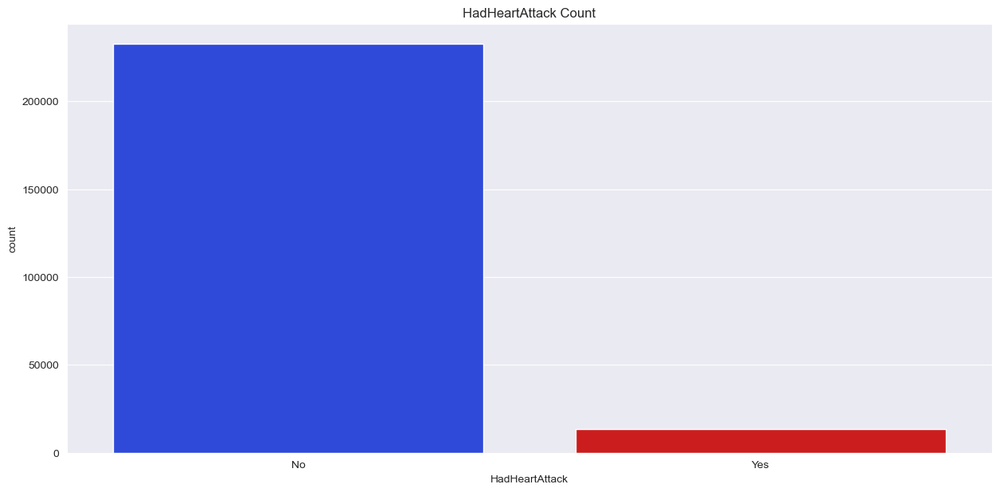

In [9]:
plt.figure(figsize=(15,7));
plt.title('HadHeartAttack Count');
sns.countplot(data=df, x='HadHeartAttack', palette=colors2, order=df['HadHeartAttack'].value_counts().index);

Imbalanced data

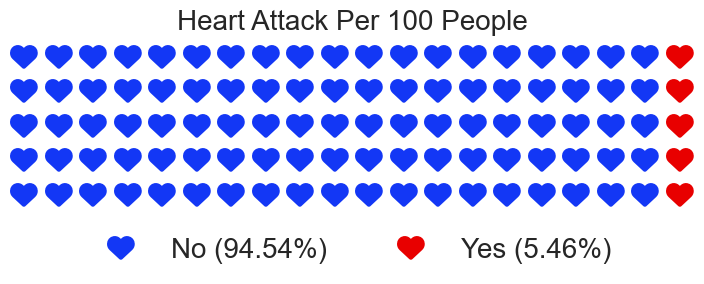

In [10]:
# get percentage of attrition then convert to dicrionary
disease_size = (df.groupby('HadHeartAttack').size()*100 / len(df)).to_dict()

# create figure
fig = plt.figure(
    FigureClass=Waffle, # type = waffle figure
    rows=5, # rows of people
    figsize = (9,3),
    values=disease_size, # data

    # legend labels
    labels=[f"{k} ({round(v / sum(disease_size.values()) * 100, 2)}%)" 
            for k, v in disease_size.items()],
    # colors for attrition and no attrition
    colors=(colors2[0], colors2[1]),
    # icons set to person for both attrition and no attriton
    icons = ['heart','heart'],
    # the legend at the bottom, after playing with the 
    # locations i centered it at the bottom
    legend={'loc': 'lower center',
            'bbox_to_anchor': (0.5, -0.5),
            'ncol': len(disease_size),
            'framealpha': 0,
            'fontsize': 20
          },

    # size of icons (people) 
    icon_size=20,

    # add icon to the legend at the bottom 
    icon_legend=True,

    #title of the waffle graph
    title={
        'label': 'Heart Attack Per 100 People',
        'loc': 'center',
        'fontdict': {'fontsize': 20}
          }
)

In [11]:
disease_size

{'No': 94.53910625878986, 'Yes': 5.4608937412101355}

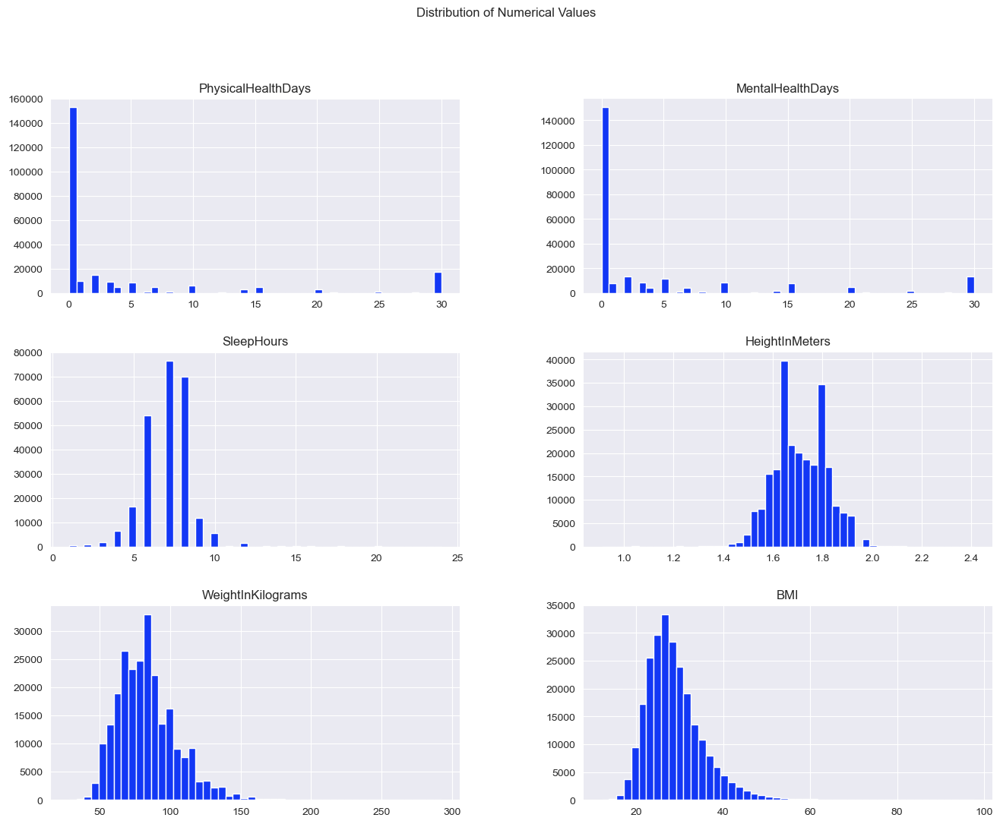

In [12]:
df.hist(figsize=(16, 12), bins=50, color=colors1);
plt.suptitle("Distribution of Numerical Values");

In [13]:
obj_cols = df.select_dtypes(include='object').columns[1:]
num_cols = df.select_dtypes(exclude='object').columns
print(f'Object columns : {obj_cols}', end='\n\n')
print(f'Numberical columns : {num_cols}')

Object columns : Index(['Sex', 'GeneralHealth', 'LastCheckupTime', 'PhysicalActivities',
       'RemovedTeeth', 'HadHeartAttack', 'HadAngina', 'HadStroke', 'HadAsthma',
       'HadSkinCancer', 'HadCOPD', 'HadDepressiveDisorder', 'HadKidneyDisease',
       'HadArthritis', 'HadDiabetes', 'DeafOrHardOfHearing',
       'BlindOrVisionDifficulty', 'DifficultyConcentrating',
       'DifficultyWalking', 'DifficultyDressingBathing', 'DifficultyErrands',
       'SmokerStatus', 'ECigaretteUsage', 'ChestScan', 'RaceEthnicityCategory',
       'AgeCategory', 'AlcoholDrinkers', 'HIVTesting', 'FluVaxLast12',
       'PneumoVaxEver', 'TetanusLast10Tdap', 'HighRiskLastYear', 'CovidPos'],
      dtype='object')

Numberical columns : Index(['PhysicalHealthDays', 'MentalHealthDays', 'SleepHours',
       'HeightInMeters', 'WeightInKilograms', 'BMI'],
      dtype='object')


C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\25529336.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df, x=obj_cols[i], palette=colors2, order=df[obj_cols[i]].value_counts().index[:6])
C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\25529336.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df, x=obj_cols[i], palette=colors6, order=df[obj_cols[i]].value_counts().index[:6])
C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\25529336.py:9: UserWarning: The palette list has more values (6) than needed (5), which may not be intended.
  ax = sns.countplot(data=df, x=obj_cols[i], palette=colors6, order=df[obj_cols[i]].value_counts().index[:6])
C:\Users\gon

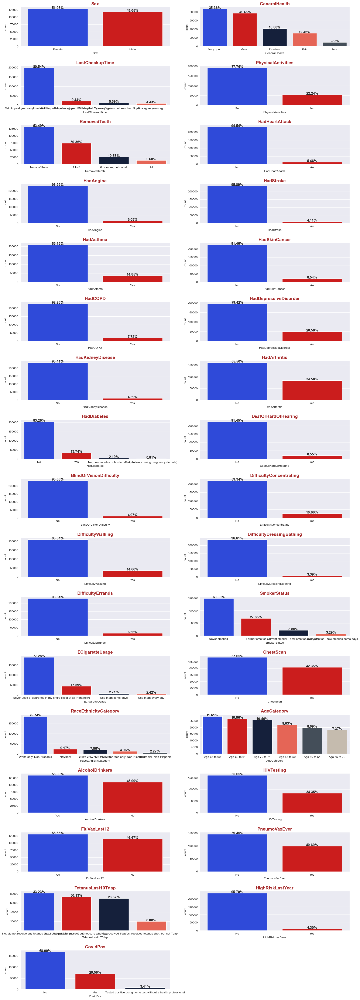

In [14]:
plt.figure(figsize=(20, 60))

for i in range(len(obj_cols)):
  plt.subplot(17, 2, i+1)

  if(df[obj_cols[i]].nunique() < 3):
    ax = sns.countplot(data=df, x=obj_cols[i], palette=colors2, order=df[obj_cols[i]].value_counts().index[:6])
  else:
    ax = sns.countplot(data=df, x=obj_cols[i], palette=colors6, order=df[obj_cols[i]].value_counts().index[:6])

  
  plt.title(f'{obj_cols[i]}', fontsize=15, fontweight='bold', color='brown')
  plt.subplots_adjust(hspace=0.5)

  for p in ax.patches:
    height = p.get_height() 
    width = p.get_width()
    percent = height/len(df)

    ax.text(x=p.get_x()+width/2, y=height+2, s=format(percent, ".2%"), fontsize=12, ha='center', weight='bold')

Features are also unbalanced

In [15]:
ax.patches

<Axes.ArtistList of 3 patches>

In [16]:
df[(df['HadHeartAttack'] == 'Yes')]['Sex'].value_counts()/df.shape[0]*100, 2

(Sex
 Male      3.456195
 Female    2.004699
 Name: count, dtype: float64,
 2)

In [17]:
df.shape

(246022, 40)

Most of people in our data are white and have no diabetic.

Left column is distribution without considering HadHeartAttack's yes or no. Right column is distribution with HadHeartAttack's yes.

In [18]:
obj_cols

Index(['Sex', 'GeneralHealth', 'LastCheckupTime', 'PhysicalActivities',
       'RemovedTeeth', 'HadHeartAttack', 'HadAngina', 'HadStroke', 'HadAsthma',
       'HadSkinCancer', 'HadCOPD', 'HadDepressiveDisorder', 'HadKidneyDisease',
       'HadArthritis', 'HadDiabetes', 'DeafOrHardOfHearing',
       'BlindOrVisionDifficulty', 'DifficultyConcentrating',
       'DifficultyWalking', 'DifficultyDressingBathing', 'DifficultyErrands',
       'SmokerStatus', 'ECigaretteUsage', 'ChestScan', 'RaceEthnicityCategory',
       'AgeCategory', 'AlcoholDrinkers', 'HIVTesting', 'FluVaxLast12',
       'PneumoVaxEver', 'TetanusLast10Tdap', 'HighRiskLastYear', 'CovidPos'],
      dtype='object')

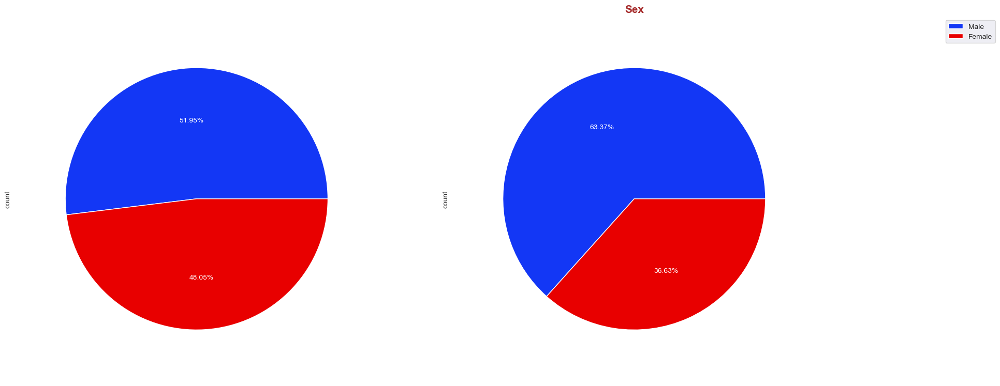

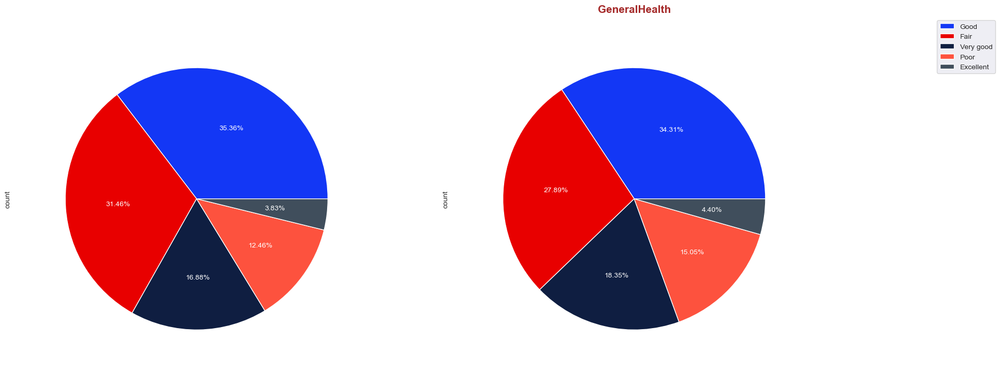

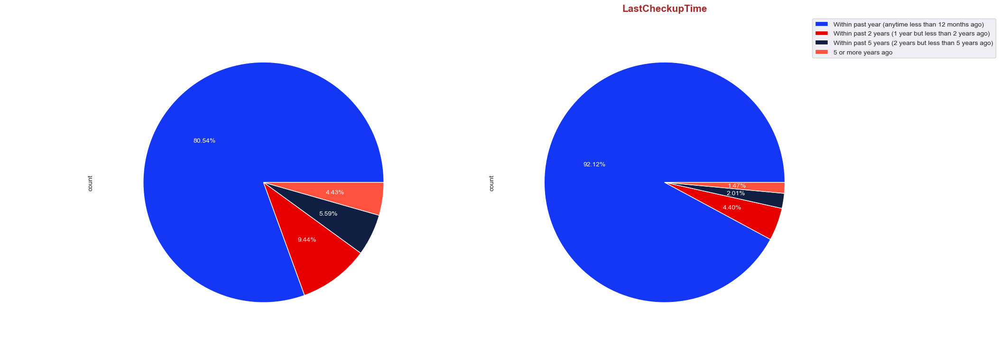

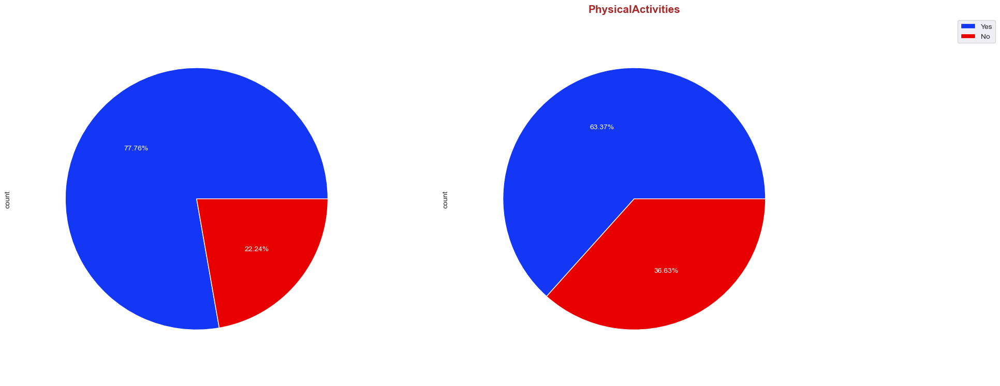

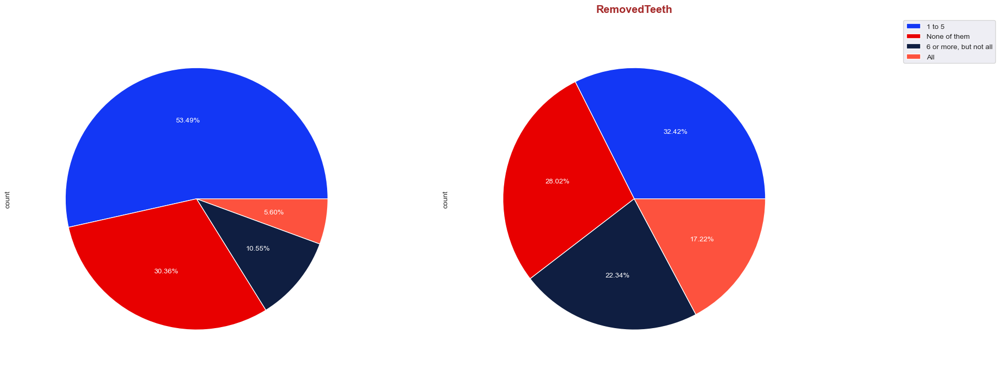

...

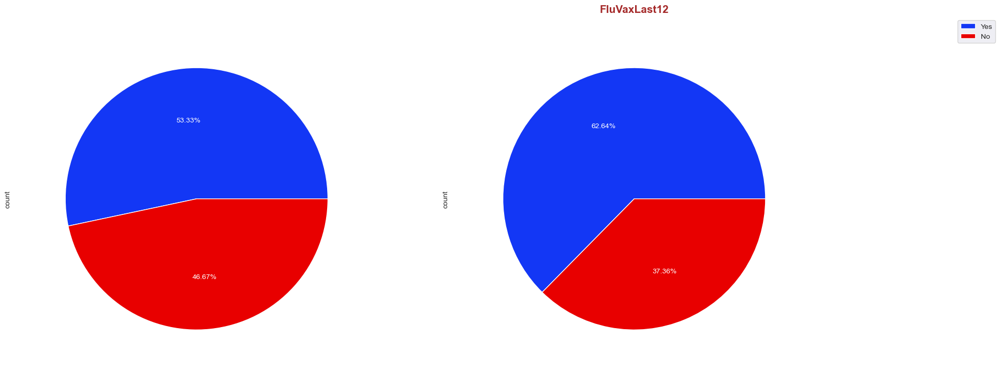

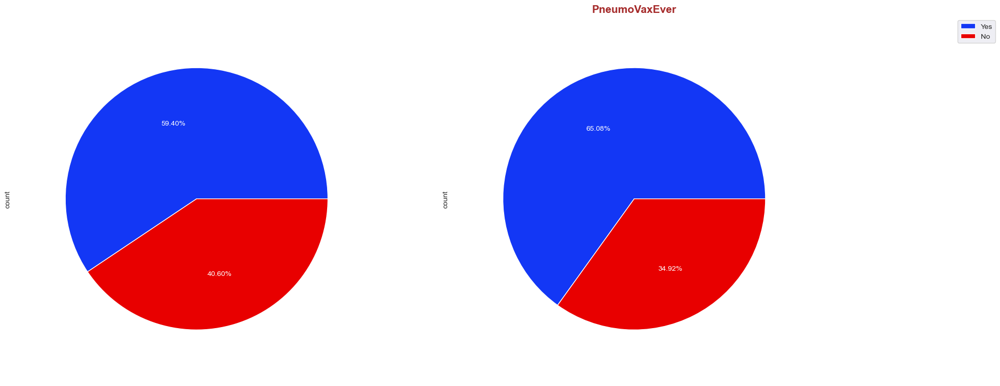

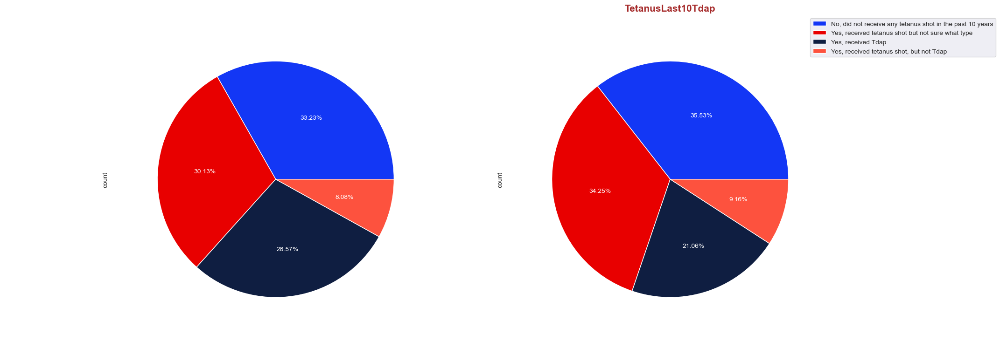

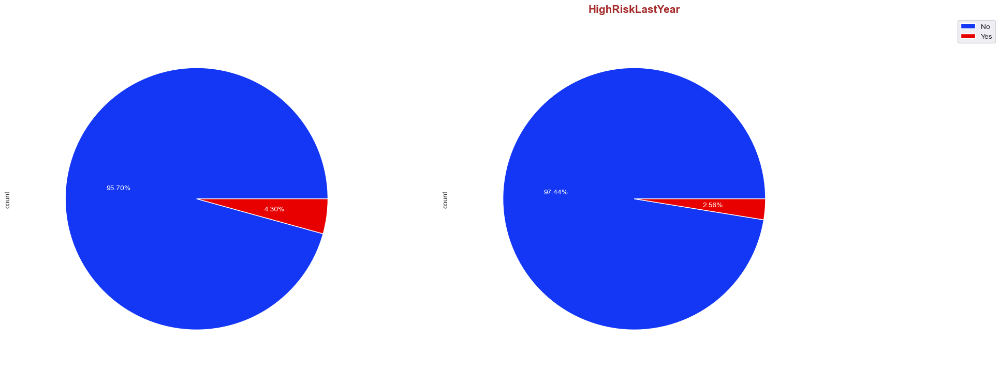

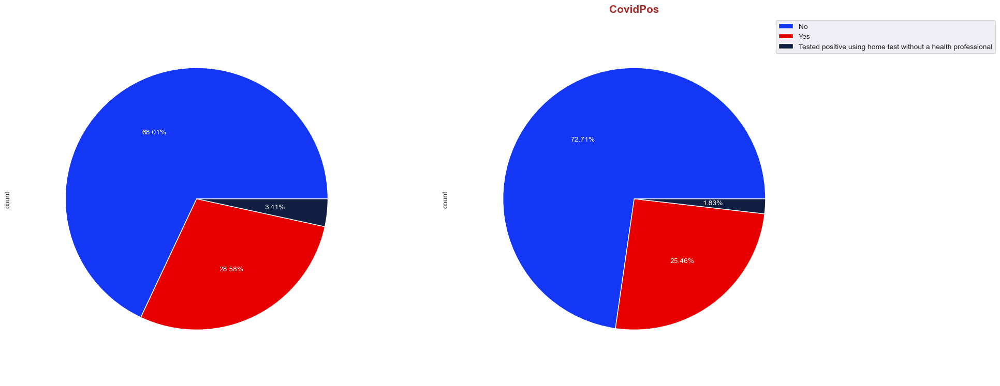

<Figure size 640x480 with 0 Axes>

In [19]:
for col in obj_cols:
    fig, ax = plt.subplots(1,2, figsize=(20,20))
    round(df[col].value_counts()/df.shape[0]*100, 2).plot.pie(autopct="%1.2f%%", ax=ax[0], textprops={"color":"white"}, colors=colors6, radius = 0.9)
    round(df[(df['HadHeartAttack'] == 'Yes')][col].value_counts()/df.shape[0]*100, 2).plot.pie(autopct="%1.2f%%", ax=ax[1], textprops={"color":"white"},colors=colors6, radius = 0.9)
    plt.legend(loc="upper right", bbox_to_anchor=(1, 0, 0.5, 1))
    plt.title(f'{col}', fontsize=15, fontweight='bold', color='brown')
    plt.show();

plt.tight_layout()

In [20]:
def show_relation(col, according_to, type_='dis'):
  plt.figure(figsize=(15,7));

  if type_=='dis':
    sns.displot(data=df, x=col, hue=according_to, kind='kde', palette=colors2);
  elif type_=='count':
    if according_to != None:
      perc = df.groupby(col)[according_to].value_counts(normalize=True).reset_index(name='Percentage')
      sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);
    else:
      sns.countplot(data=df, x=col, hue=according_to, palette=colors1, order=df[col].value_counts().index);

  if according_to==None:
    plt.title(f'{col}');
  else: 
    plt.title(f'{col} according to {according_to}');

In [21]:
num_cols[5]

'BMI'

<Figure size 1500x700 with 0 Axes>

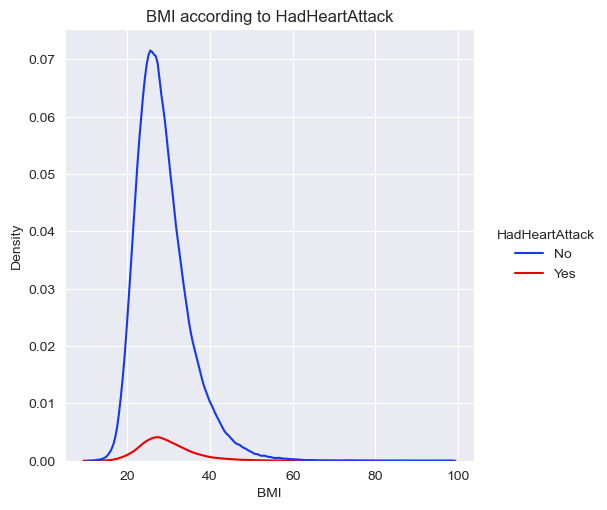

In [22]:
show_relation(num_cols[5], 'HadHeartAttack');

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\2542193203.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='BMI', y='HadHeartAttack', saturation=0.4,
C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\2542193203.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='BMI', y='HadHeartAttack',inner='quartile', palette=colors2);


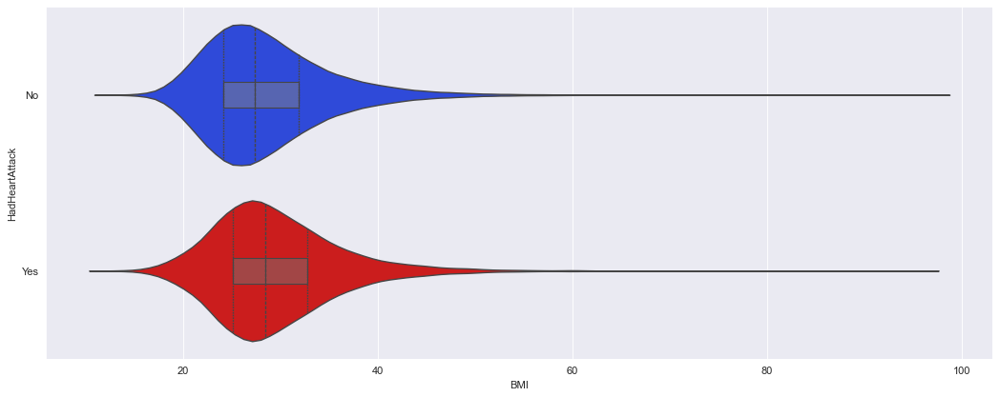

In [23]:
plt.figure(figsize=(16, 6), dpi=80)

sns.boxplot(data=df, x='BMI', y='HadHeartAttack', saturation=0.4, 
            width=0.15, boxprops={'zorder': 2},
            showfliers = False, whis=0,  palette=colors2);
sns.violinplot(data=df, x='BMI', y='HadHeartAttack',inner='quartile', palette=colors2);

BMI didnt affect Heart Attack

<Figure size 1500x700 with 0 Axes>

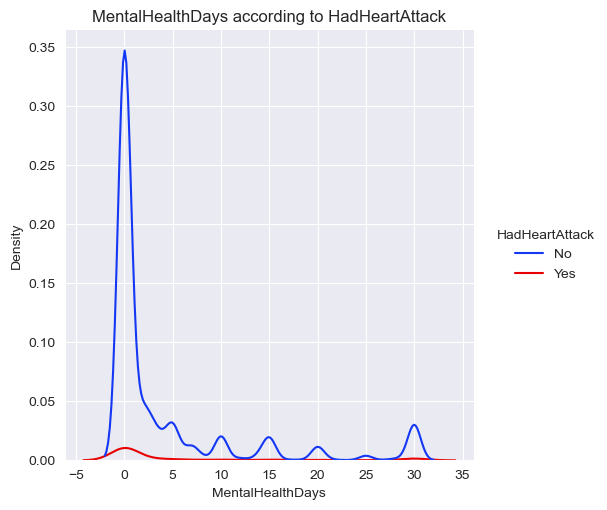

In [24]:
show_relation(num_cols[1], 'HadHeartAttack')

In [25]:
obj_cols[25]

'AgeCategory'

In [26]:
df.groupby('AgeCategory')['HadHeartAttack'].value_counts(normalize=True).reset_index(name='Percentage')

,AgeCategory,HadHeartAttack,Percentage
0,Age 18 to 24,No,0.996190
1,Age 18 to 24,Yes,0.003810
2,Age 25 to 29,No,0.995769
3,Age 25 to 29,Yes,0.004231
4,Age 30 to 34,No,0.993256
5,Age 30 to 34,Yes,0.006744
6,Age 35 to 39,No,0.990009
7,Age 35 to 39,Yes,0.009991
8,Age 40 to 44,No,0.986567
9,Age 40 to 44,Yes,0.013433


C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


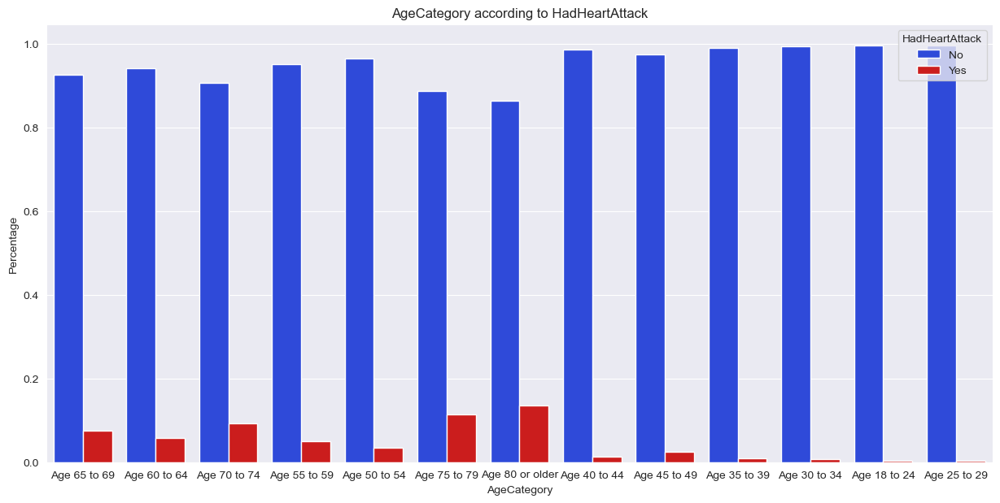

In [27]:
show_relation(obj_cols[25], 'HadHeartAttack', type_='count')

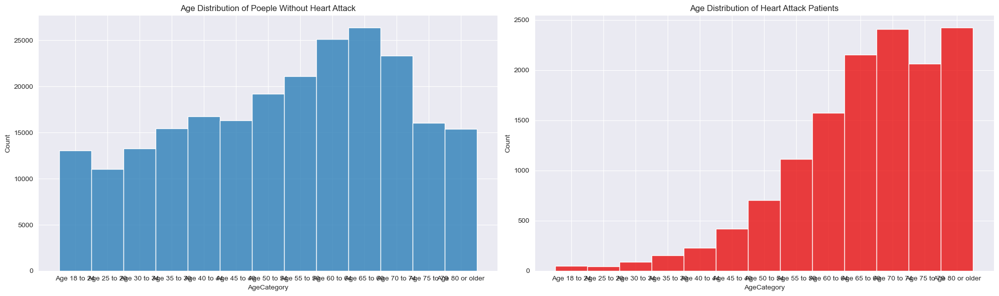

In [28]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 6))

sns.histplot(data=df.loc[df.HadHeartAttack == 'No'].sort_values("AgeCategory"), x='AgeCategory', ax=ax1);
ax1.set_title("Age Distribution of Poeple Without Heart Attack")

sns.histplot(data=df.loc[df.HadHeartAttack == 'Yes'].sort_values("AgeCategory"), x='AgeCategory',
                  color=colors2[1], ax=ax2);
ax2.set_title("Age Distribution of Heart Attack Patients")


fig.tight_layout()

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


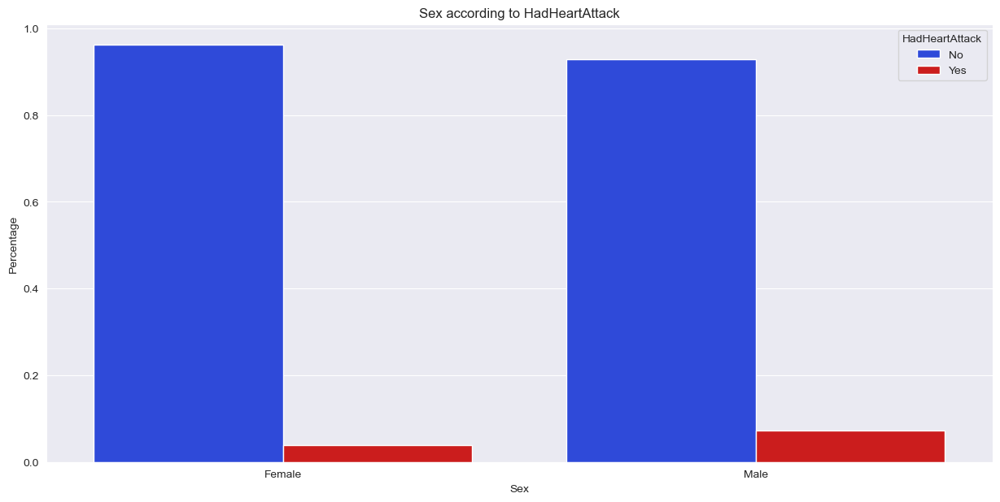

In [29]:
show_relation(obj_cols[0], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


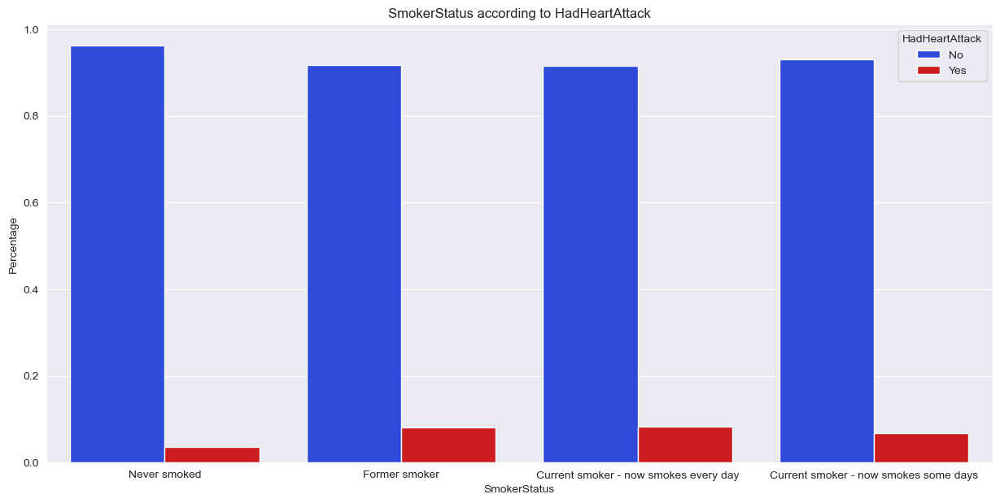

In [30]:
show_relation(obj_cols[21], 'HadHeartAttack', type_='count')

We can observe that the people who are smoking are more susceptible to the heart attack.

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


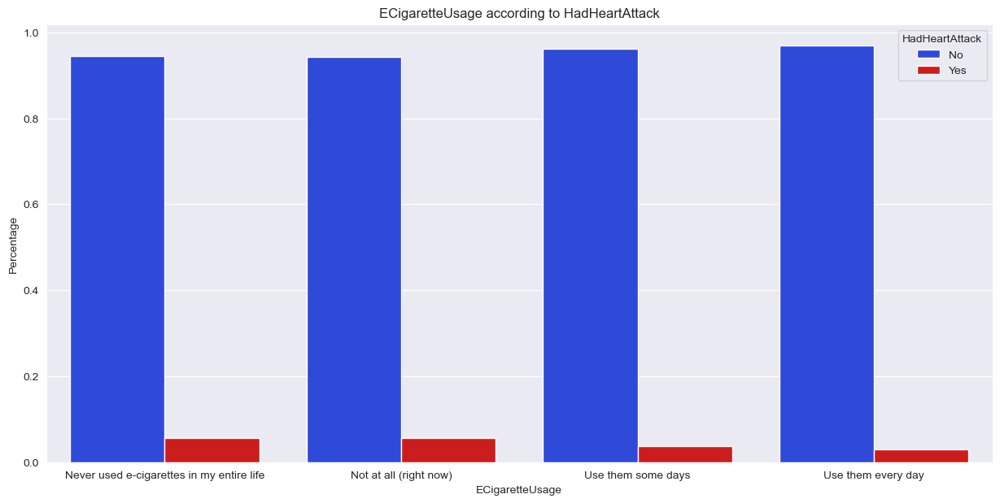

In [31]:
show_relation(obj_cols[22], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


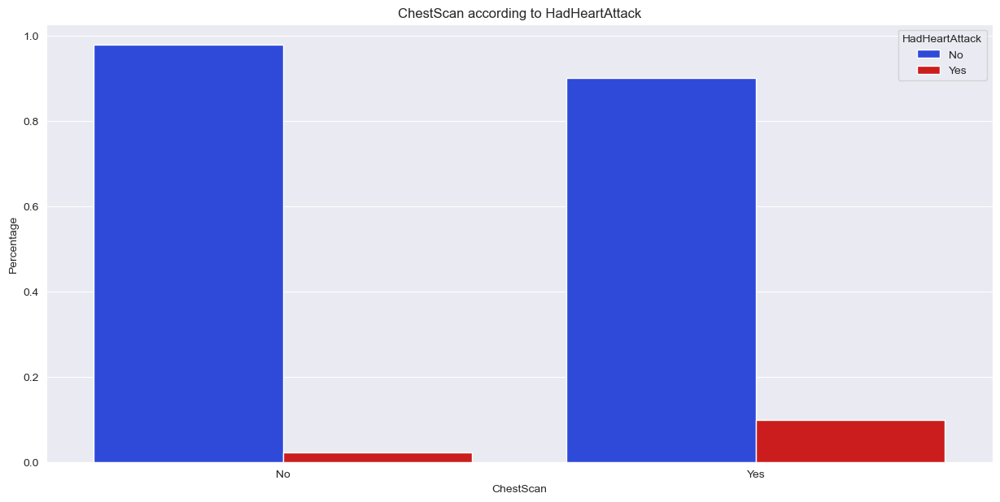

In [32]:
show_relation(obj_cols[23], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


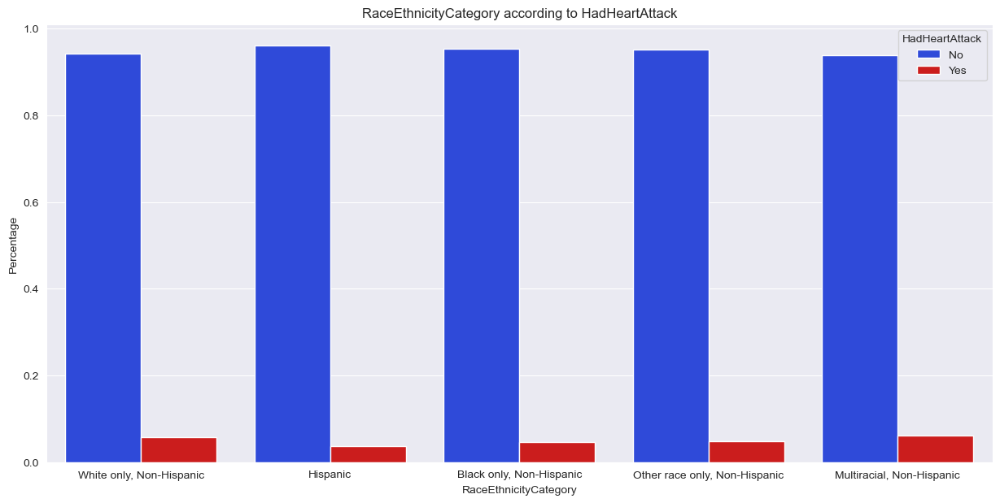

In [33]:
show_relation(obj_cols[24], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


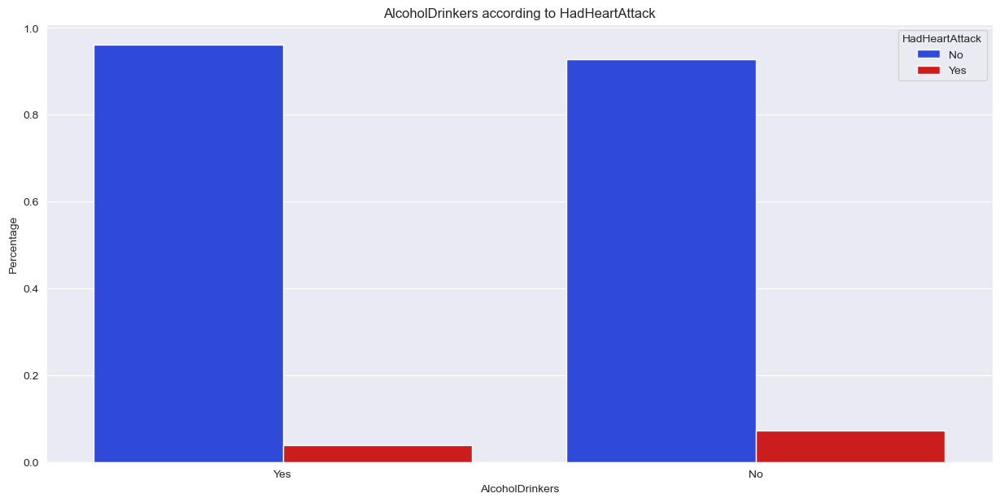

In [34]:
show_relation(obj_cols[26], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


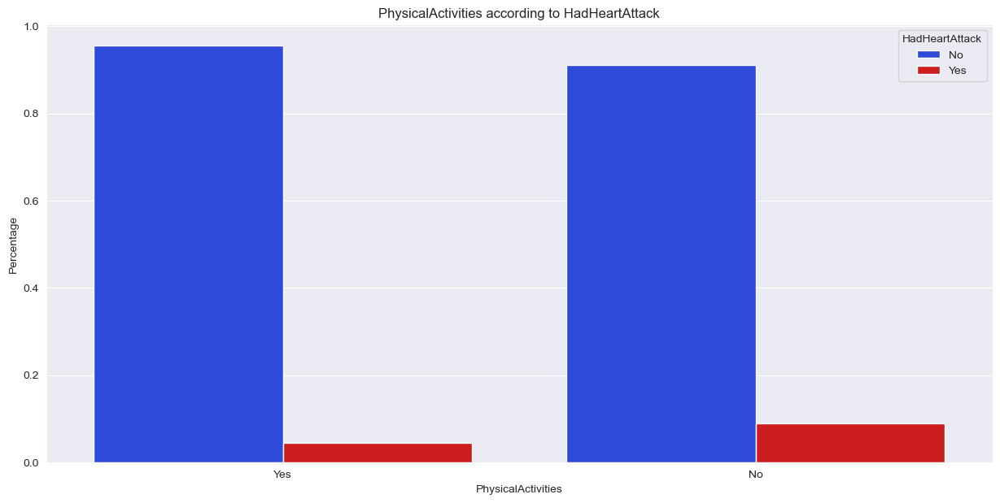

In [35]:
show_relation(obj_cols[3], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


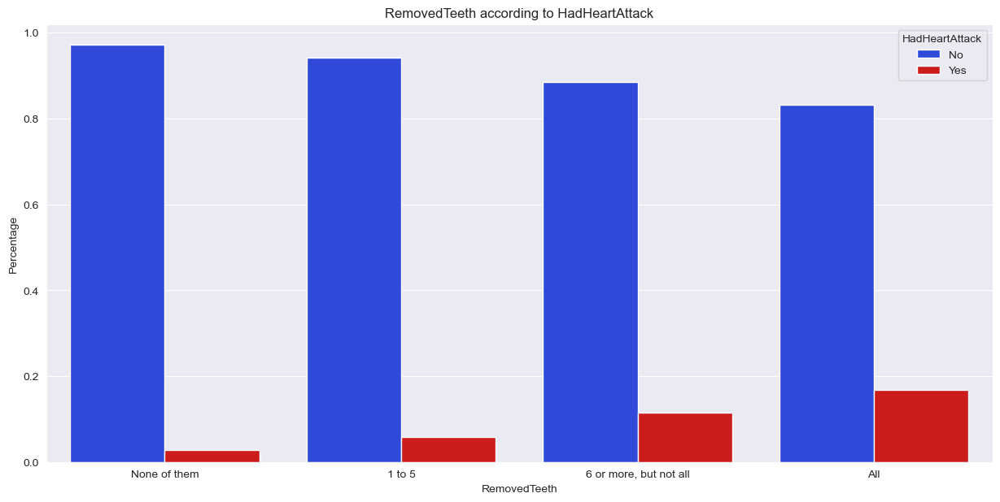

In [36]:
show_relation(obj_cols[4], 'HadHeartAttack', type_='count')

Number of Removed Teeth can represent patient's age

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


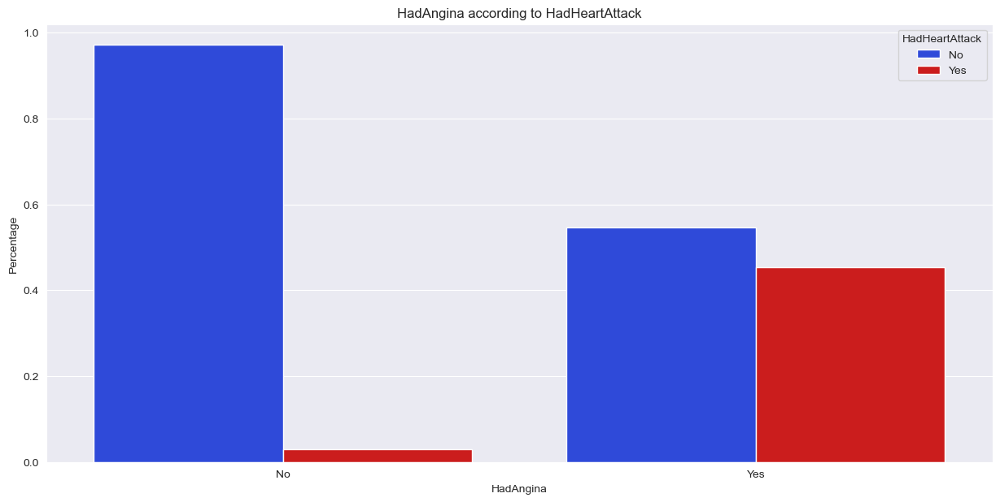

In [37]:
show_relation(obj_cols[6], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


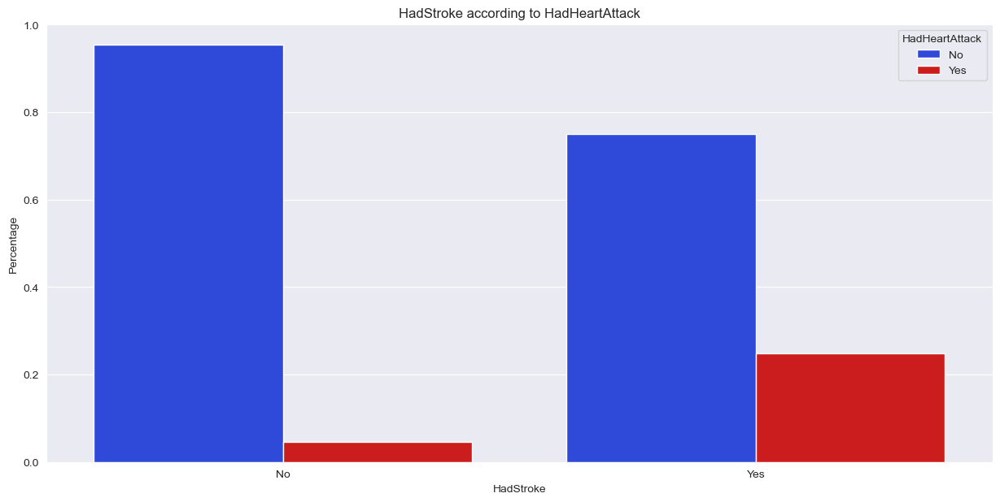

In [38]:
show_relation(obj_cols[7], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


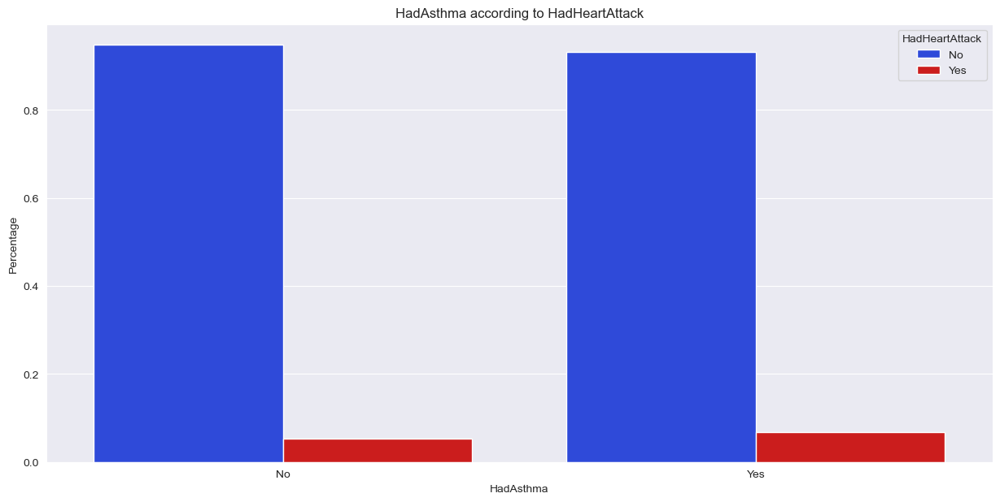

In [39]:
show_relation(obj_cols[8], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


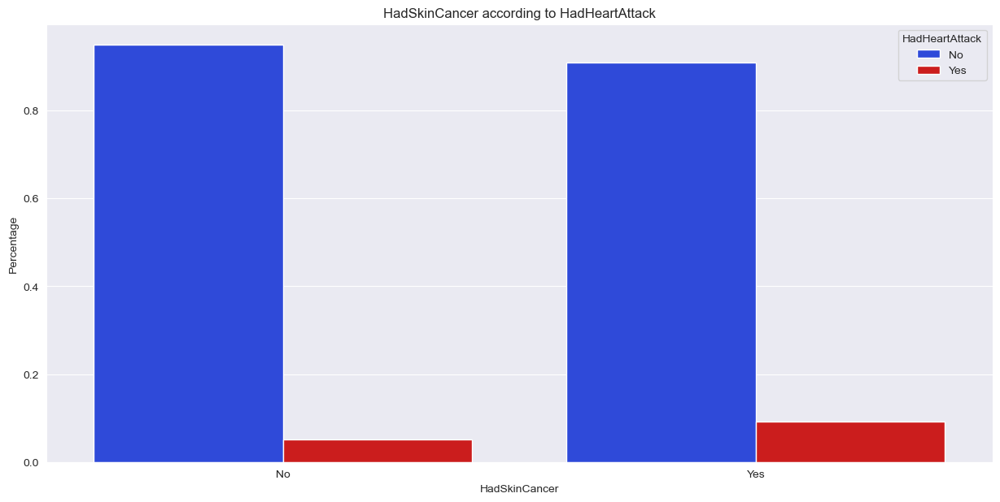

In [40]:
show_relation(obj_cols[9], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


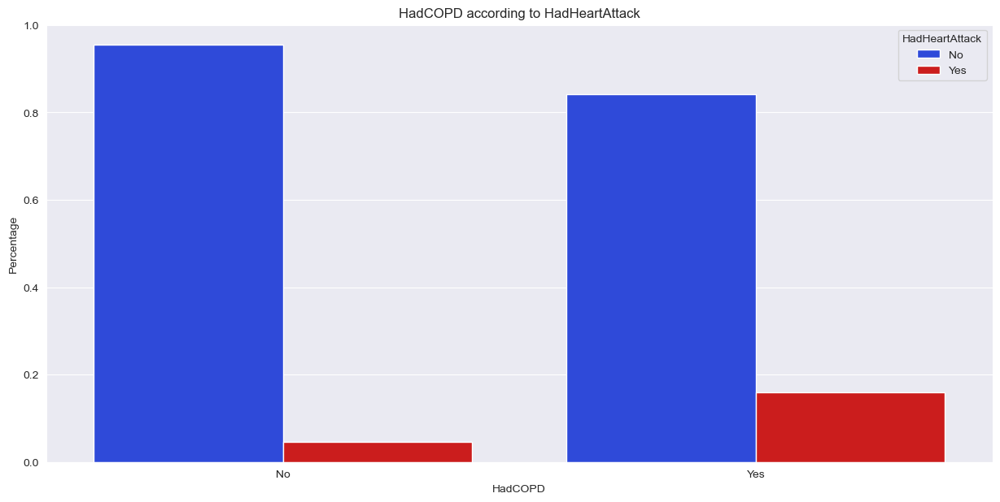

In [41]:
show_relation(obj_cols[10], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


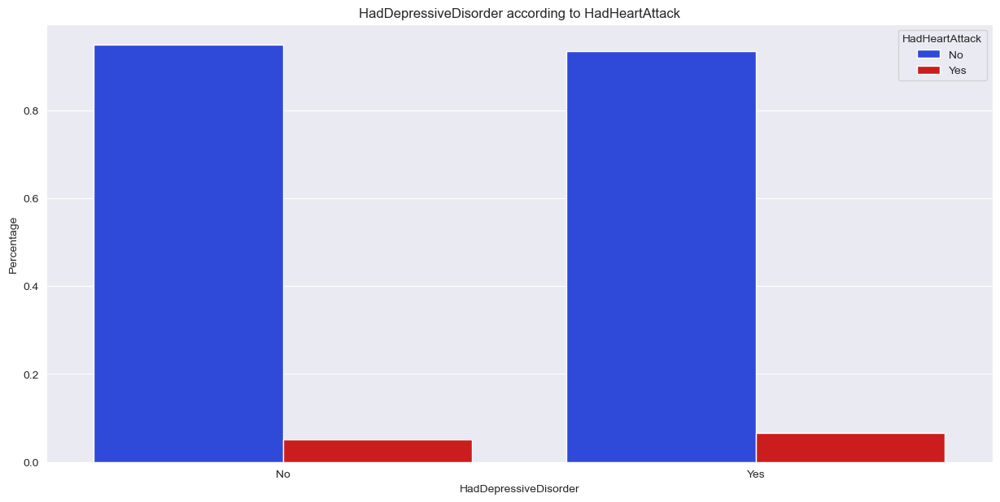

In [42]:
show_relation(obj_cols[11], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


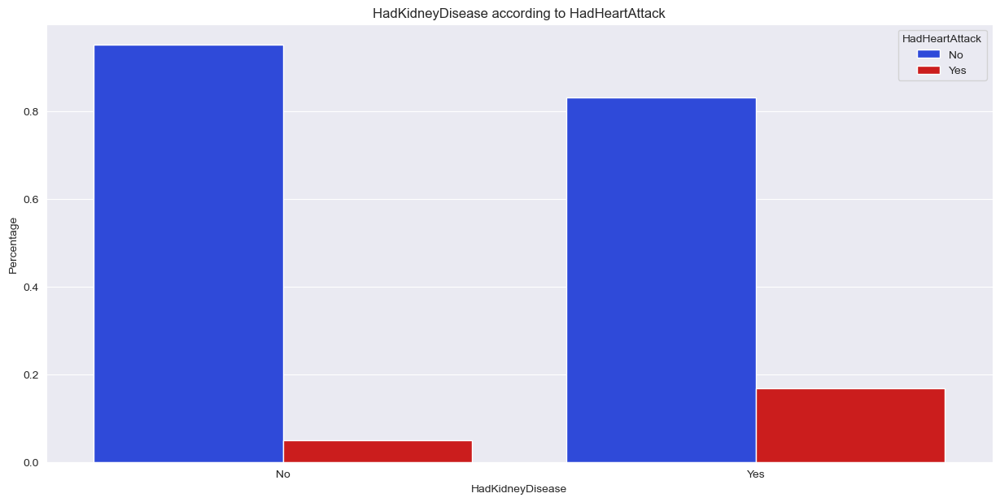

In [43]:
show_relation(obj_cols[12], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


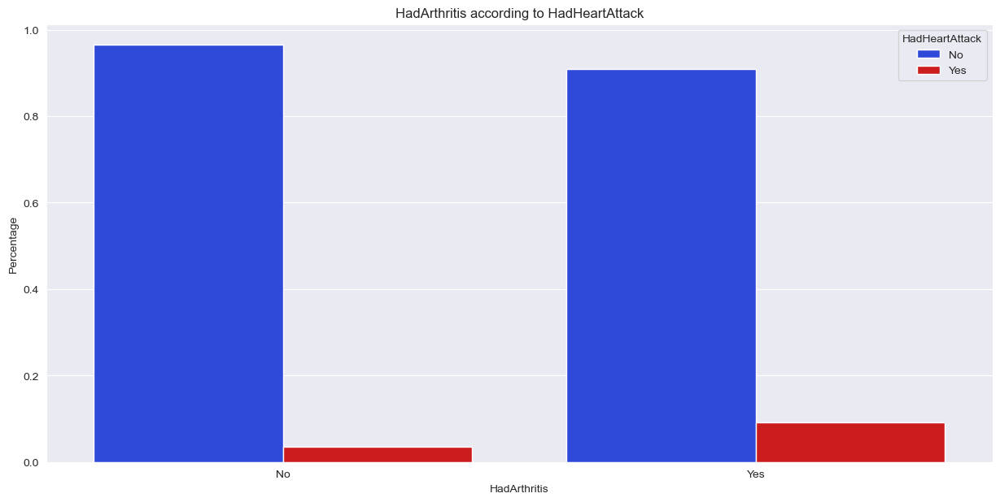

In [44]:
show_relation(obj_cols[13], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


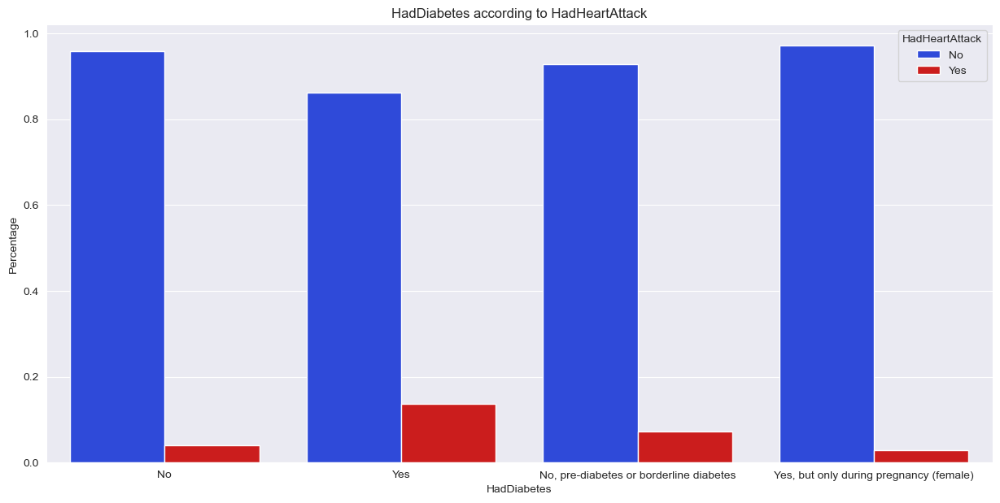

In [45]:
show_relation(obj_cols[14], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1999965520.py:9: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.barplot(data=perc, x=col,y='Percentage', hue=according_to, palette=colors6, order=df[col].value_counts().index);


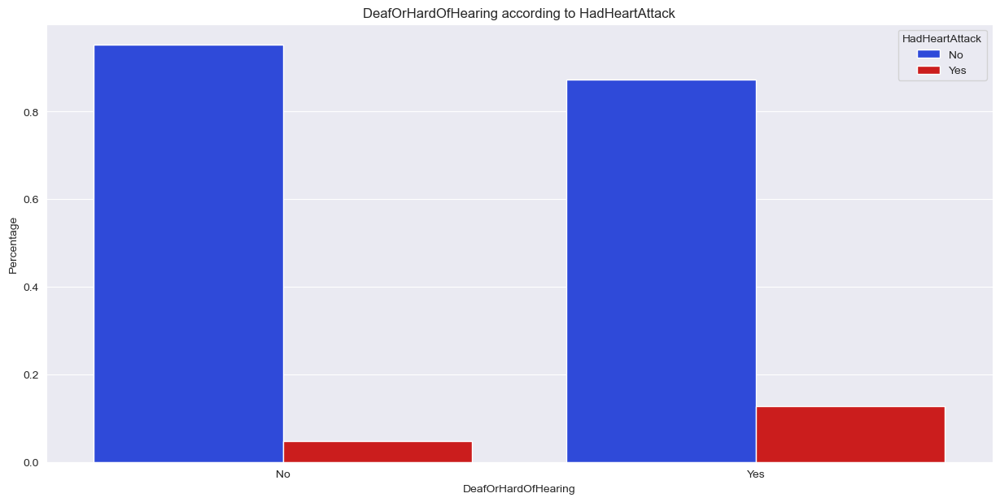

In [46]:
show_relation(obj_cols[15], 'HadHeartAttack', type_='count')

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\2147422513.py:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[df["HadHeartAttack"]=='Yes']["BMI"], alpha=1,shade = False, color=colors6[0], label="HadHeartAttack", ax = ax)
C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\2147422513.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[df["HadKidneyDisease"]=='Yes']["BMI"], alpha=1,shade = False, color=colors6[1], label="HadKidneyDisease", ax = ax)
C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\2147422513.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[df["HadSkinCancer"]=='Yes']["BMI"], alpha=1,shad

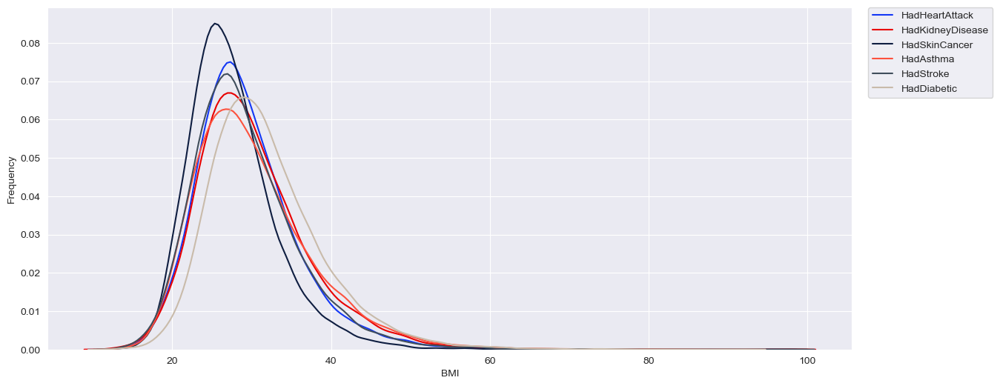

In [47]:
fig, ax = plt.subplots(figsize = (14,6))
sns.kdeplot(df[df["HadHeartAttack"]=='Yes']["BMI"], alpha=1,shade = False, color=colors6[0], label="HadHeartAttack", ax = ax)
sns.kdeplot(df[df["HadKidneyDisease"]=='Yes']["BMI"], alpha=1,shade = False, color=colors6[1], label="HadKidneyDisease", ax = ax)
sns.kdeplot(df[df["HadSkinCancer"]=='Yes']["BMI"], alpha=1,shade = False, color=colors6[2], label="HadSkinCancer", ax = ax)
sns.kdeplot(df[df["HadAsthma"]=='Yes']["BMI"], alpha=1,shade = False, color=colors6[3], label="HadAsthma", ax = ax)
sns.kdeplot(df[df["HadStroke"]=='Yes']["BMI"], alpha=1,shade = False, color=colors6[4], label="HadStroke", ax = ax)
sns.kdeplot(df[df["HadDiabetes"]=='Yes']["BMI"], alpha=1,shade = False, color=colors6[5], label="HadDiabetic", ax = ax)


ax.set_xlabel("BMI")
ax.set_ylabel("Frequency")
ax.legend(bbox_to_anchor=(1.02, 1), loc=2, borderaxespad=0.)
plt.show()

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1491682513.py:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[df["HadHeartAttack"]=='Yes']["MentalHealthDays"], alpha=1,shade = False, color=colors6[0], label="HadHeartAttack", ax = ax)
C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1491682513.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[df["HadKidneyDisease"]=='Yes']["MentalHealthDays"], alpha=1,shade = False, color=colors6[1], label="HadKidneyDisease", ax = ax)
C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\1491682513.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[df["HadSkinCancer"]=='

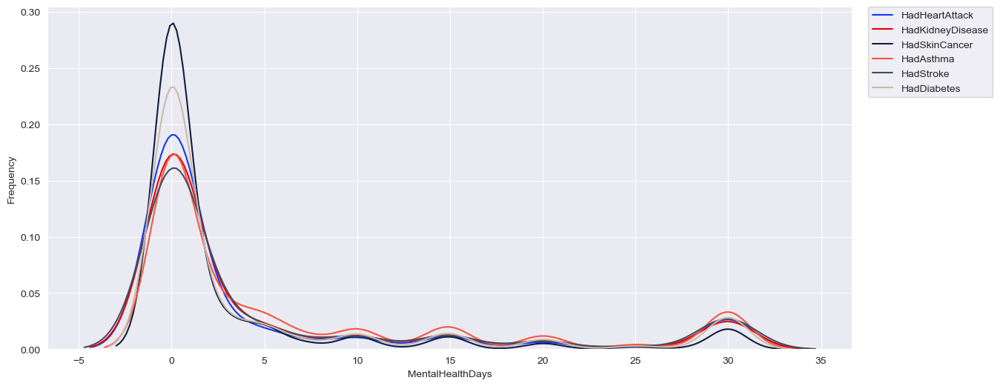

In [48]:
fig, ax = plt.subplots(figsize = (14,6))
sns.kdeplot(df[df["HadHeartAttack"]=='Yes']["MentalHealthDays"], alpha=1,shade = False, color=colors6[0], label="HadHeartAttack", ax = ax)
sns.kdeplot(df[df["HadKidneyDisease"]=='Yes']["MentalHealthDays"], alpha=1,shade = False, color=colors6[1], label="HadKidneyDisease", ax = ax)
sns.kdeplot(df[df["HadSkinCancer"]=='Yes']["MentalHealthDays"], alpha=1,shade = False, color=colors6[2], label="HadSkinCancer", ax = ax)
sns.kdeplot(df[df["HadAsthma"]=='Yes']["MentalHealthDays"], alpha=1,shade = False, color=colors6[3], label="HadAsthma", ax = ax)
sns.kdeplot(df[df["HadStroke"]=='Yes']["MentalHealthDays"], alpha=1,shade = False, color=colors6[4], label="HadStroke", ax = ax)
sns.kdeplot(df[df["HadDiabetes"]=='Yes']["MentalHealthDays"], alpha=1,shade = False, color=colors6[5], label="HadDiabetes", ax = ax)


ax.set_xlabel("MentalHealthDays")
ax.set_ylabel("Frequency")
ax.legend(bbox_to_anchor=(1.02, 1), loc=2, borderaxespad=0.)
plt.show()

C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\3313891655.py:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[df["HadHeartAttack"]=='Yes']["SleepHours"], alpha=1,shade = False, color=colors6[0], label="HadHeartAttack", ax = ax)
C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\3313891655.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[df["HadKidneyDisease"]=='Yes']["SleepHours"], alpha=1,shade = False, color=colors6[1], label="HadKidneyDisease", ax = ax)
C:\Users\gongl1\AppData\Local\Temp\ipykernel_25320\3313891655.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[df["HadSkinCancer"]=='Yes']["Sleep

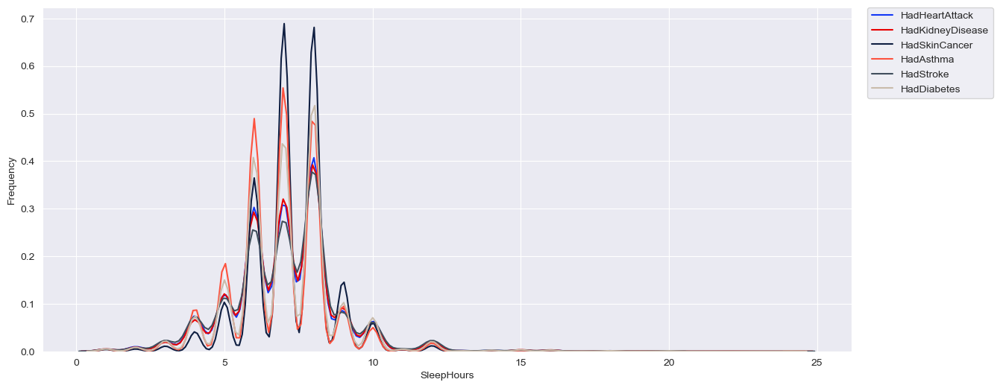

In [49]:
fig, ax = plt.subplots(figsize = (14,6))
sns.kdeplot(df[df["HadHeartAttack"]=='Yes']["SleepHours"], alpha=1,shade = False, color=colors6[0], label="HadHeartAttack", ax = ax)
sns.kdeplot(df[df["HadKidneyDisease"]=='Yes']["SleepHours"], alpha=1,shade = False, color=colors6[1], label="HadKidneyDisease", ax = ax)
sns.kdeplot(df[df["HadSkinCancer"]=='Yes']["SleepHours"], alpha=1,shade = False, color=colors6[2], label="HadSkinCancer", ax = ax)
sns.kdeplot(df[df["HadAsthma"]=='Yes']["SleepHours"], alpha=1,shade = False, color=colors6[3], label="HadAsthma", ax = ax)
sns.kdeplot(df[df["HadStroke"]=='Yes']["SleepHours"], alpha=1,shade = False, color=colors6[4], label="HadStroke", ax = ax)
sns.kdeplot(df[df["HadDiabetes"]=='Yes']["SleepHours"], alpha=1,shade = False, color=colors6[5], label="HadDiabetes", ax = ax)


ax.set_xlabel("SleepHours")
ax.set_ylabel("Frequency")
ax.legend(bbox_to_anchor=(1.02, 1), loc=2, borderaxespad=0.)
plt.show()

# Feature Engineering

In [50]:
region_mapping = {
    'Connecticut': 'Northeast', 'Maine': 'Northeast', 'Massachusetts': 'Northeast',
    'New Hampshire': 'Northeast', 'New Jersey': 'Northeast', 'New York': 'Northeast',
    'Pennsylvania': 'Northeast', 'Rhode Island': 'Northeast', 'Vermont': 'Northeast',
    'Illinois': 'Midwest', 'Indiana': 'Midwest', 'Iowa': 'Midwest', 'Kansas': 'Midwest',
    'Michigan': 'Midwest', 'Minnesota': 'Midwest', 'Missouri': 'Midwest', 'Nebraska': 'Midwest',
    'North Dakota': 'Midwest', 'Ohio': 'Midwest', 'South Dakota': 'Midwest', 'Wisconsin': 'Midwest',
    'Alabama': 'South', 'Arkansas': 'South', 'Delaware': 'South', 'Florida': 'South',
    'Georgia': 'South', 'Kentucky': 'South', 'Louisiana': 'South', 'Maryland': 'South',
    'Mississippi': 'South', 'North Carolina': 'South', 'Oklahoma': 'South', 'South Carolina': 'South',
    'Tennessee': 'South', 'Texas': 'South', 'Virginia': 'South', 'West Virginia': 'South',
    'Alaska': 'West', 'Arizona': 'West', 'California': 'West', 'Colorado': 'West',
    'Hawaii': 'West', 'Idaho': 'West', 'Montana': 'West', 'Nevada': 'West',
    'New Mexico': 'West', 'Oregon': 'West', 'Utah': 'West', 'Washington': 'West', 'Wyoming': 'West'
}

df['Location'] = df['State'].map(region_mapping)

# Drop the original column
df.drop('State', axis=1, inplace=True)

In [51]:
df['Location'].value_counts()

Location
South        65951
Midwest      65783
West         62819
Northeast    43863
Name: count, dtype: int64

In [52]:
df['HadHeartAttack'].value_counts()
#17:1 

HadHeartAttack
No     232587
Yes     13435
Name: count, dtype: int64

Check correlation matrix for numeric columns

                    PhysicalHealthDays  MentalHealthDays  SleepHours  \
PhysicalHealthDays            1.000000          0.306800   -0.056063   
MentalHealthDays              0.306800          1.000000   -0.130100   
SleepHours                   -0.056063         -0.130100    1.000000   
HeightInMeters               -0.049180         -0.056010   -0.011384   
WeightInKilograms             0.077505          0.042441   -0.054691   
BMI                           0.116905          0.082182   -0.054750   

                    HeightInMeters  WeightInKilograms       BMI  
PhysicalHealthDays       -0.049180           0.077505  0.116905  
MentalHealthDays         -0.056010           0.042441  0.082182  
SleepHours               -0.011384          -0.054691 -0.054750  
HeightInMeters            1.000000           0.473768 -0.026637  
WeightInKilograms         0.473768           1.000000  0.859313  
BMI                      -0.026637           0.859313  1.000000  


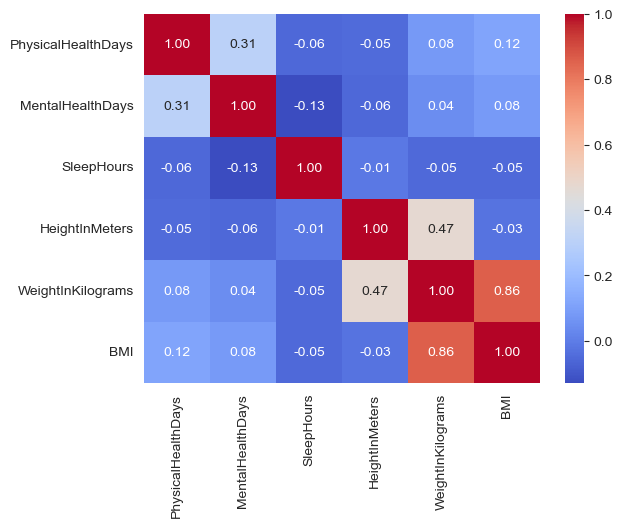

In [53]:
correlation_matrix = df[numeric_vars].corr()

print(correlation_matrix)

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

Now drop 'WeightInKilograms'

                    PhysicalHealthDays  MentalHealthDays  SleepHours  \
PhysicalHealthDays            1.000000          0.306800   -0.056063   
MentalHealthDays              0.306800          1.000000   -0.130100   
SleepHours                   -0.056063         -0.130100    1.000000   
HeightInMeters               -0.049180         -0.056010   -0.011384   
BMI                           0.116905          0.082182   -0.054750   

                    HeightInMeters       BMI  
PhysicalHealthDays       -0.049180  0.116905  
MentalHealthDays         -0.056010  0.082182  
SleepHours               -0.011384 -0.054750  
HeightInMeters            1.000000 -0.026637  
BMI                      -0.026637  1.000000  


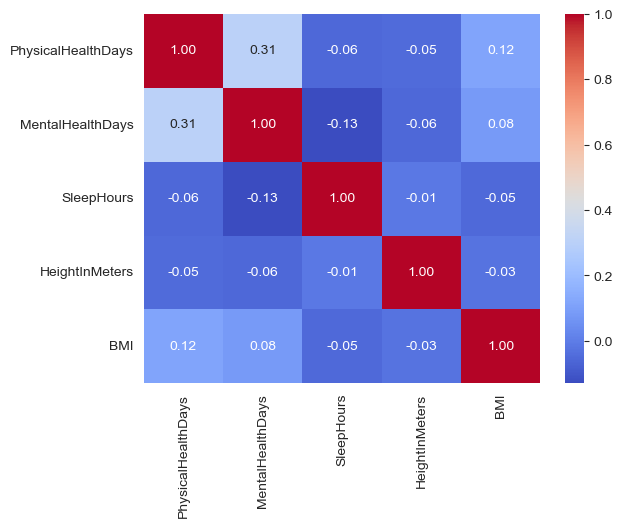

In [54]:
numeric_vars = ['PhysicalHealthDays', 'MentalHealthDays', 'SleepHours', 'HeightInMeters', 'BMI']

df.drop('WeightInKilograms', axis=1, inplace=True)

correlation_matrix = df[numeric_vars].corr()

print(correlation_matrix)

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

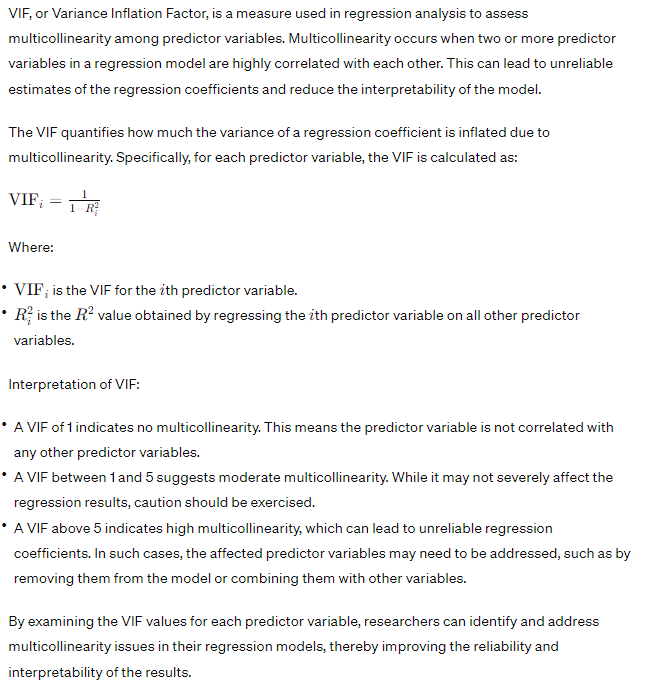

In [55]:
numeric_df = df[numeric_vars]

X = add_constant(numeric_df)

vif_data = pd.DataFrame()
vif_data['Variable'] = X.columns

vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)

             Variable         VIF
0               const  311.539297
1  PhysicalHealthDays    1.115642
2    MentalHealthDays    1.124034
3          SleepHours    1.019833
4      HeightInMeters    1.005062
5                 BMI    1.018593


In [56]:
categoric_vars.remove('State')
categoric_vars.append('HadHeartAttack')
categoric_vars.append('Location')
len(categoric_vars)

34

# Oversampling (Due to imbalanced data)

In [57]:
df_encoded = pd.get_dummies(df, columns=categoric_vars, drop_first=True)

In [58]:
pd.set_option('display.max_columns', None)
df_encoded.head(10)

,PhysicalHealthDays,MentalHealthDays,SleepHours,HeightInMeters,BMI,Sex_Male,GeneralHealth_Fair,GeneralHealth_Good,GeneralHealth_Poor,GeneralHealth_Very good,LastCheckupTime_Within past 2 years (1 year but less than 2 years ago),LastCheckupTime_Within past 5 years (2 years but less than 5 years ago),LastCheckupTime_Within past year (anytime less than 12 months ago),PhysicalActivities_Yes,"RemovedTeeth_6 or more, but not all",RemovedTeeth_All,RemovedTeeth_None of them,HadAngina_Yes,HadStroke_Yes,HadAsthma_Yes,HadSkinCancer_Yes,HadCOPD_Yes,HadDepressiveDisorder_Yes,HadKidneyDisease_Yes,HadArthritis_Yes,"HadDiabetes_No, pre-diabetes or borderline diabetes",HadDiabetes_Yes,"HadDiabetes_Yes, but only during pregnancy (female)",DeafOrHardOfHearing_Yes,BlindOrVisionDifficulty_Yes,DifficultyConcentrating_Yes,DifficultyWalking_Yes,DifficultyDressingBathing_Yes,DifficultyErrands_Yes,SmokerStatus_Current smoker - now smokes some days,SmokerStatus_Former smoker,SmokerStatus_Never smoked,ECigaretteUsage_Not at all (right now),ECigaretteUsage_Use them every day,ECigaretteUsage_Use them some days,ChestScan_Yes,RaceEthnicityCategory_Hispanic,"RaceEthnicityCategory_Multiracial, Non-Hispanic","RaceEthnicityCategory_Other race only, Non-Hispanic","RaceEthnicityCategory_White only, Non-Hispanic",AgeCategory_Age 25 to 29,AgeCategory_Age 30 to 34,AgeCategory_Age 35 to 39,AgeCategory_Age 40 to 44,AgeCategory_Age 45 to 49,AgeCategory_Age 50 to 54,AgeCategory_Age 55 to 59,AgeCategory_Age 60 to 64,AgeCategory_Age 65 to 69,AgeCategory_Age 70 to 74,AgeCategory_Age 75 to 79,AgeCategory_Age 80 or older,AlcoholDrinkers_Yes,HIVTesting_Yes,FluVaxLast12_Yes,PneumoVaxEver_Yes,"TetanusLast10Tdap_Yes, received Tdap","TetanusLast10Tdap_Yes, received tetanus shot but not sure what type","TetanusLast10Tdap_Yes, received tetanus shot, but not Tdap",HighRiskLastYear_Yes,CovidPos_Tested positive using home test without a health professional,CovidPos_Yes,HadHeartAttack_Yes,Location_Northeast,Location_South,Location_West
0,4.0,0.0,9.0,1.60,27.99,False,False,False,False,True,False,False,True,True,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,True,True,False,False,False,False,False,False,False,True,False
1,0.0,0.0,6.0,1.78,30.13,True,False,False,False,True,False,False,True,True,False,False,True,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,True,False,True,False,False,False,False,False,False,True,False
2,0.0,0.0,8.0,1.85,31.66,True,False,False,False,True,False,False,True,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,True,False,False,False,True,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,True,False,False,False,False,False,True,False,False,True,False
3,5.0,0.0,9.0,1.70,31.32,False,True,False,False,False,False,False,True,True,False,False,True,False,False,False,True,False,True,False,True,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,True,False,False,False,False,False,True,False,False,True,False
4,3.0,15.0,5.0,1.55,33.07,False,False,True,False,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,True,False,Fa

In [59]:
pd.set_option('display.max_rows', None)
df_encoded.dtypes

PhysicalHealthDays                                                         float64
MentalHealthDays                                                           float64
SleepHours                                                                 float64
HeightInMeters                                                             float64
BMI                                                                        float64
Sex_Male                                                                      bool
GeneralHealth_Fair                                                            bool
GeneralHealth_Good                                                            bool
GeneralHealth_Poor                                                            bool
GeneralHealth_Very good                                                       bool
LastCheckupTime_Within past 2 years (1 year but less than 2 years ago)        bool
LastCheckupTime_Within past 5 years (2 years but less than 5 years ago)       bool
Last

In [60]:
df_encoded.shape

(246022, 71)

In [61]:
df_encoded = df_encoded.astype(int)
pd.set_option('display.max_columns', None)
df_encoded.head(10)

,PhysicalHealthDays,MentalHealthDays,SleepHours,HeightInMeters,BMI,Sex_Male,GeneralHealth_Fair,GeneralHealth_Good,GeneralHealth_Poor,GeneralHealth_Very good,LastCheckupTime_Within past 2 years (1 year but less than 2 years ago),LastCheckupTime_Within past 5 years (2 years but less than 5 years ago),LastCheckupTime_Within past year (anytime less than 12 months ago),PhysicalActivities_Yes,"RemovedTeeth_6 or more, but not all",RemovedTeeth_All,RemovedTeeth_None of them,HadAngina_Yes,HadStroke_Yes,HadAsthma_Yes,HadSkinCancer_Yes,HadCOPD_Yes,HadDepressiveDisorder_Yes,HadKidneyDisease_Yes,HadArthritis_Yes,"HadDiabetes_No, pre-diabetes or borderline diabetes",HadDiabetes_Yes,"HadDiabetes_Yes, but only during pregnancy (female)",DeafOrHardOfHearing_Yes,BlindOrVisionDifficulty_Yes,DifficultyConcentrating_Yes,DifficultyWalking_Yes,DifficultyDressingBathing_Yes,DifficultyErrands_Yes,SmokerStatus_Current smoker - now smokes some days,SmokerStatus_Former smoker,SmokerStatus_Never smoked,ECigaretteUsage_Not at all (right now),ECigaretteUsage_Use them every day,ECigaretteUsage_Use them some days,ChestScan_Yes,RaceEthnicityCategory_Hispanic,"RaceEthnicityCategory_Multiracial, Non-Hispanic","RaceEthnicityCategory_Other race only, Non-Hispanic","RaceEthnicityCategory_White only, Non-Hispanic",AgeCategory_Age 25 to 29,AgeCategory_Age 30 to 34,AgeCategory_Age 35 to 39,AgeCategory_Age 40 to 44,AgeCategory_Age 45 to 49,AgeCategory_Age 50 to 54,AgeCategory_Age 55 to 59,AgeCategory_Age 60 to 64,AgeCategory_Age 65 to 69,AgeCategory_Age 70 to 74,AgeCategory_Age 75 to 79,AgeCategory_Age 80 or older,AlcoholDrinkers_Yes,HIVTesting_Yes,FluVaxLast12_Yes,PneumoVaxEver_Yes,"TetanusLast10Tdap_Yes, received Tdap","TetanusLast10Tdap_Yes, received tetanus shot but not sure what type","TetanusLast10Tdap_Yes, received tetanus shot, but not Tdap",HighRiskLastYear_Yes,CovidPos_Tested positive using home test without a health professional,CovidPos_Yes,HadHeartAttack_Yes,Location_Northeast,Location_South,Location_West
0,4,0,9,1,27,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,1,0
1,0,0,6,1,30,1,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0
2,0,0,8,1,31,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0
3,5,0,9,1,31,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,0
4,3,15,5,1,33,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0
5,0,0,7,1,34,1,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,1,0
6,3,0,8,1,33,0,0,1,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0
7,5,0,8,1,24,1,1,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,1,0,0,0,0,0,1,1,0,1,0
8,2,0,6,1,26,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
9,0,0,7,1,22,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0


# Feature selection

### from interpret.glassbox import LogisticRegression

In [62]:
# Before SMOTE
X = df_encoded.drop('HadHeartAttack_Yes', axis=1)
y = df_encoded['HadHeartAttack_Yes']

In [63]:
from interpret.glassbox import LogisticRegression

X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.2, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

logreg_ss=LogisticRegression(solver="liblinear", penalty="l2", C=0.00001, max_iter=10000)
logreg_ss.fit(X_train_scaled,y_train)
y_pred_log=logreg_ss.predict(X_test_scaled)

y_pred_proba_log = logreg_ss.predict_proba(X_test_scaled)
fpr_log, tpr_log, _ = metrics.roc_curve(y_test, y_pred_proba_log[:,1])
auc_log = round(metrics.auc(fpr_log, tpr_log),5)


simple_log = pd.DataFrame(data=[accuracy_score(y_test, y_pred_log),
                                                                    precision_score(y_test, y_pred_log, average='binary'),
                                                                    recall_score(y_test, y_pred_log, average='binary'),
                                                                    f1_score(y_test, y_pred_log, average='binary'),
                                                                    roc_auc_score(y_test, y_pred_proba_log[:,1])],
                                                                    index=['Accuracy','Precision','Recall','F1-score','AUC'],
                                                                     columns = ["Logestic_regression_simple"])

simple_log

,Logestic_regression_simple
Accuracy,0.946550
Precision,0.531425
Recall,0.345368
F1-score,0.418656
AUC,0.889810


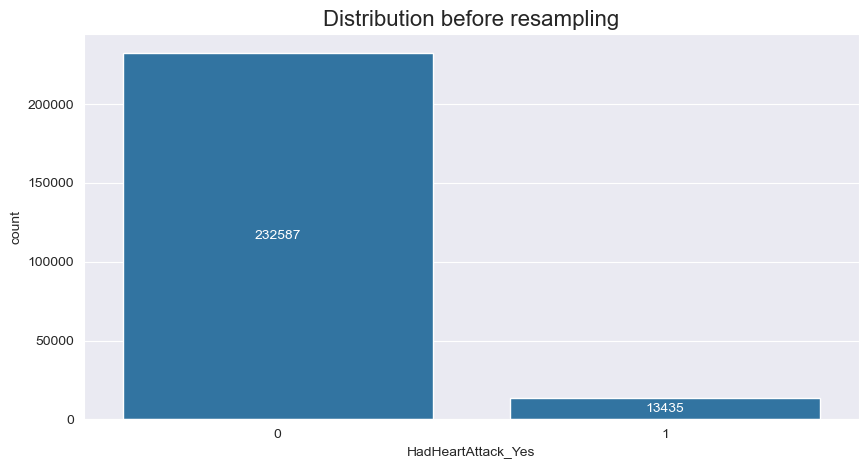

In [64]:
plt.figure(figsize = (10,5))
ax=sns.countplot(data=df_encoded , x = 'HadHeartAttack_Yes')
for container in ax.containers:
    ax.bar_label(container, label_type='center', rotation=0, color='white')
plt.title("Distribution before resampling", size=16)    
plt.show()

In [65]:
pip install -U imbalanced-learn


  Obtaining dependency information for imbalanced-learn from https://files.pythonhosted.org/packages/92/e8/86c36e1b13007ca9c89381adac6c078cfc8fb71841a76c08a3fe3eca91d3/imbalanced_learn-0.12.0-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/257.7 kB ? eta -:--:--
   - -------------------------------------- 10.2/257.7 kB ? eta -:--:--
   -------------- ------------------------- 92.2/257.7 kB 1.1 MB/s eta 0:00:01
   ---------------------------------------  256.0/257.7 kB 2.6 MB/s eta 0:00:01
   ---------------------------------------- 257.7/257.7 kB 2.0 MB/s eta 0:00:00
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.11.0
    Uninstalling imbalanced-learn-0.11.0:
      Successfully uninstalled imbalanced-learn-0.11.0
Note: you may need to restart the kernel to use updated packages.


## SMOTE

C:\Users\gongl1\AppData\Local\anaconda3\Lib\site-packages\imblearn\over_sampling\_smote\base.py:345: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  def __init__(


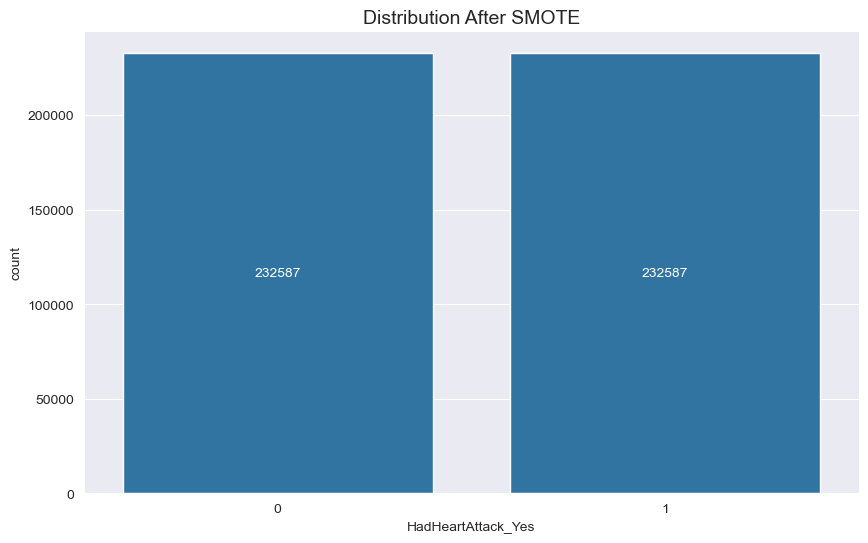

In [66]:
smote = SMOTE(n_jobs=-1, random_state=0)
X_smote, y_smote = smote.fit_resample(X, y)


plt.figure(figsize = (10,6))
ax=sns.countplot( x = y_smote ,)
for container in ax.containers:
    ax.bar_label(container, label_type='center', rotation=0, color='white')
plt.title("Distribution After SMOTE", size=14)
plt.show()

In [67]:
# After SMOTE

X_train , X_test, y_train,  y_test = train_test_split(X_smote, y_smote , test_size=0.2, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

logreg_s=LogisticRegression(solver="liblinear", penalty="l2", C=0.00001, max_iter=10000)
logreg_s.fit(X_train_scaled,y_train)
y_pred_log=logreg_s.predict(X_test_scaled)

y_pred_proba_log = logreg_s.predict_proba(X_test_scaled)
fpr_log, tpr_log, _ = metrics.roc_curve(y_test, y_pred_proba_log[:,1])
auc_log = round(metrics.auc(fpr_log, tpr_log),5)


SMOTE_log = pd.DataFrame(data=[accuracy_score(y_test, y_pred_log),
                                                                    precision_score(y_test, y_pred_log, average='binary'),
                                                                    recall_score(y_test, y_pred_log, average='binary'),
                                                                    f1_score(y_test, y_pred_log, average='binary'),
                                                                    roc_auc_score(y_test, y_pred_proba_log[:,1])],
                                                                    index=['Accuracy','Precision','Recall','F1-score','AUC'],
                                                                     columns = ["Logestic_regression_smote"])

SMOTE_log

,Logestic_regression_smote
Accuracy,0.885312
Precision,0.874661
Recall,0.898344
F1-score,0.886344
AUC,0.953757


### sm.Logit model

### final_features have significance_level < 0.05

In [70]:
X_smote_const = sm.add_constant(X_smote)

def backward_elimination(X_smote, y_smote, significance_level=0.05):
    num_vars = X_smote.shape[1]
    for i in range(num_vars):
        model = sm.Logit(y_smote, X_smote).fit(disp=0)
        max_p_value = max(model.pvalues.iloc[1:])  # Excluding constant terms
        feature_with_max_p_value = model.pvalues.iloc[1:].idxmax()
        if max_p_value > significance_level:
            X_smote = X_smote.drop([feature_with_max_p_value], axis=1)
        else:
            break
    return model, X_smote.columns.tolist()

final_logit_model, final_features = backward_elimination(X_smote_const, y_smote)

print(final_logit_model.summary())
print("Final features selected:", final_features)


                           Logit Regression Results                           
Dep. Variable:     HadHeartAttack_Yes   No. Observations:               465174
Model:                          Logit   Df Residuals:                   465103
Method:                           MLE   Df Model:                           70
Date:                Tue, 05 Mar 2024   Pseudo R-squ.:                  0.6838
Time:                        23:50:34   Log-Likelihood:            -1.0196e+05
converged:                       True   LL-Null:                   -3.2243e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------------------
const                                                                       9.6304      

In [77]:
final_features = ['PhysicalHealthDays', 'MentalHealthDays', 'SleepHours', 'HeightInMeters', 'BMI', 'Sex_Male', 'GeneralHealth_Fair', 'GeneralHealth_Good', 'GeneralHealth_Poor', 'GeneralHealth_Very good', 'LastCheckupTime_Within past 2 years (1 year but less than 2 years ago)', 'LastCheckupTime_Within past 5 years (2 years but less than 5 years ago)', 'LastCheckupTime_Within past year (anytime less than 12 months ago)', 'PhysicalActivities_Yes', 'RemovedTeeth_6 or more, but not all', 'RemovedTeeth_All', 'RemovedTeeth_None of them', 'HadAngina_Yes', 'HadStroke_Yes', 'HadAsthma_Yes', 'HadSkinCancer_Yes', 'HadCOPD_Yes', 'HadDepressiveDisorder_Yes', 'HadKidneyDisease_Yes', 'HadArthritis_Yes', 'HadDiabetes_No, pre-diabetes or borderline diabetes', 'HadDiabetes_Yes', 'HadDiabetes_Yes, but only during pregnancy (female)', 'DeafOrHardOfHearing_Yes', 'BlindOrVisionDifficulty_Yes', 'DifficultyConcentrating_Yes', 'DifficultyWalking_Yes', 'DifficultyDressingBathing_Yes', 'DifficultyErrands_Yes', 'SmokerStatus_Current smoker - now smokes some days', 'SmokerStatus_Former smoker', 'SmokerStatus_Never smoked', 'ECigaretteUsage_Not at all (right now)', 'ECigaretteUsage_Use them every day', 'ECigaretteUsage_Use them some days', 'ChestScan_Yes',  'AlcoholDrinkers_Yes', 'HIVTesting_Yes', 'FluVaxLast12_Yes', 'PneumoVaxEver_Yes', 'TetanusLast10Tdap_Yes, received Tdap', 'TetanusLast10Tdap_Yes, received tetanus shot but not sure what type', 'TetanusLast10Tdap_Yes, received tetanus shot, but not Tdap', 'HighRiskLastYear_Yes', 'CovidPos_Tested positive using home test without a health professional', 'CovidPos_Yes', 'Location_Northeast', 'Location_South', 'Location_West']
len(final_features)

54

In [78]:
#final_logit_model.params

### Features with larger coefficient magnitudes (in absolute terms) are considered more important in logistic regression, as they have a greater impact on the log-odds of the target variable.

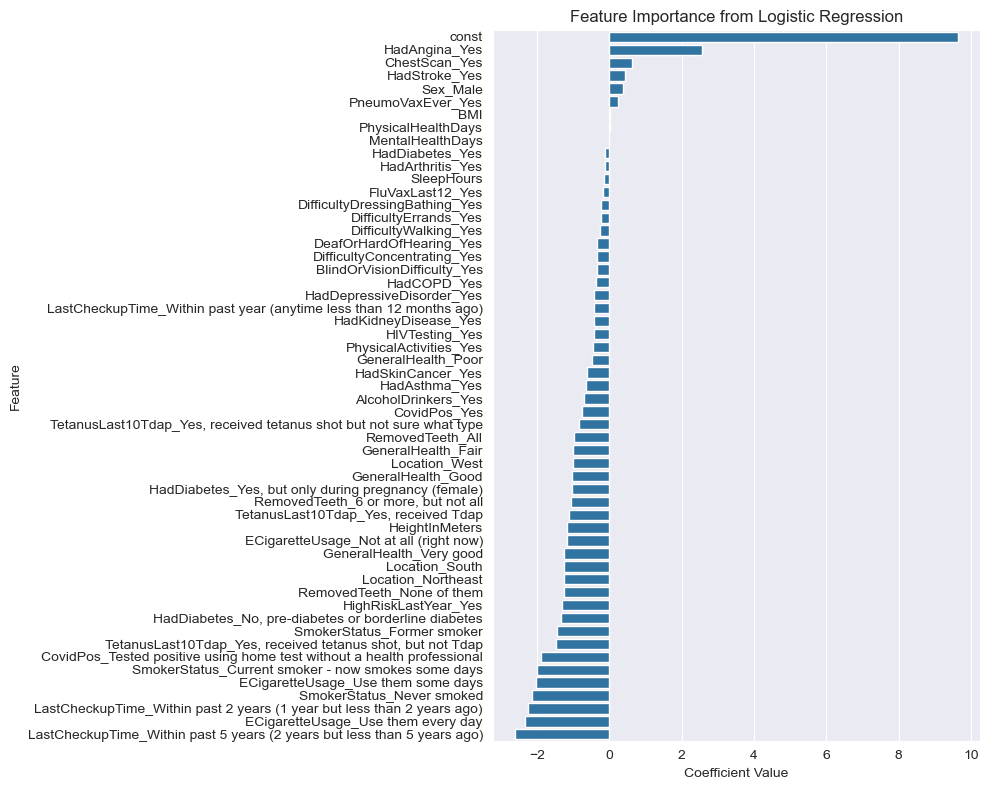

In [79]:
coefficients = final_logit_model.params

coef_df = pd.DataFrame(coefficients, columns=['Coefficient']).reset_index()
coef_df.rename(columns={'index': 'Feature'}, inplace=True)

final_features_with_const = ['const'] + final_features  # 'const' add an item

coef_df = coef_df[coef_df['Feature'].isin(final_features_with_const)]

coef_df = coef_df.sort_values(by='Coefficient', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='Coefficient', y='Feature', data=coef_df)
plt.title('Feature Importance from Logistic Regression')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.tight_layout()  # adjust the graph to avoid truncation
plt.show()


# Model Engineering
### Then move on to LogisticRegression with refined X (54 features), y above - exclude ages and race
### explain_global()

In [80]:
X = df_encoded[final_features]
y = df_encoded['HadHeartAttack_Yes']
X_smote, y_smote = smote.fit_resample(X, y)

C:\Users\gongl1\AppData\Local\anaconda3\Lib\site-packages\imblearn\over_sampling\_smote\base.py:345: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  def __init__(


In [81]:
X_train , X_test, y_train,  y_test = train_test_split(X_smote, y_smote , test_size=0.2, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

logit_model = LogisticRegression(max_iter=3000, random_state=42)
logit_model.fit(X_train_scaled,y_train)

auc = roc_auc_score(y_test, logit_model.predict_proba(X_test)[:, 1])
print("Logistic Regression AUC on Test Set: {:.3f}".format(auc))

Logistic Regression AUC on Test Set: 0.838


In [82]:
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, test_size=0.2, random_state=0)


logit_model = LogisticRegression(max_iter=3000, random_state=42)
logit_model.fit(X_train, y_train)

y_pred = logit_model.predict(X_test)
y_pred_proba = logit_model.predict_proba(X_test)[:, 1]

auc = roc_auc_score(y_test, y_pred_proba)
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy: {:.3f}".format(accuracy))
print("Recall: {:.3f}".format(recall))
print("Precision: {:.3f}".format(precision))
print("F1 Score: {:.3f}".format(f1))
print("Logistic Regression AUC on Test Set: {:.3f}".format(auc))


Accuracy: 0.873
Recall: 0.869
Precision: 0.875
F1 Score: 0.872
Logistic Regression AUC on Test Set: 0.944


In [83]:
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, test_size=0.2, random_state=42)


logit_model = LogisticRegression(random_state=42, max_iter=3000)
logit_model.fit(X_train, y_train)

y_pred = logit_model.predict(X_test)
y_pred_prob = logit_model.predict_proba(X_test)[:, 1]

auc = roc_auc_score(y_test, y_pred_prob)
print("Logistic Regression AUC on Test Set: {:.3f}".format(auc))

lr_global = logit_model.explain_global()
show(lr_global)

Logistic Regression AUC on Test Set: 0.945


### ExplainableBoostingClassifier() - Explainable Boosting Machine (EBM)

Explainable Boosting Machine (EBM) is a machine learning algorithm that combines the principles of traditional gradient boosting with transparent and interpretable modeling techniques. EBM is designed to provide accurate predictions while also offering explanations or interpretations for those predictions, making it particularly useful in domains where understanding the model's reasoning is crucial, such as healthcare or finance.

Key features of EBM include:

Interpretability: EBM constructs models that are inherently interpretable, meaning that the **relationships between input features and the predicted outcome are transparent and understandable**. This transparency facilitates trust in the model's predictions and helps stakeholders comprehend the factors driving those predictions.

Additive modeling: Similar to traditional boosting algorithms, **EBM builds an ensemble of weak learners (often decision trees) sequentially, where each subsequent learner focuses on capturing the patterns that were not adequately addressed by previous learners. However, EBM differs from other boosting methods by using additive rather than multiplicative updates, which simplifies the interpretation of the resulting model**.

Monotonicity constraints: EBM allows users to impose monotonicity constraints on the relationships between input features and the predicted outcome. This means that **users can specify whether they expect certain features to have a positive or negative impact on the prediction**, thereby aligning the model's behavior with domain knowledge or business requirements.

Global and local explanations: EBM provides both global explanations, which describe the overall behavior of the model across the entire dataset, and local explanations, which explain individual predictions. Local explanations help users understand why a particular prediction was made for a specific instance, offering insights into the model's decision-making process.

Overall, EBM strikes a balance between predictive performance and interpretability, making it a valuable tool for applications where understanding the underlying logic of the model is as important as achieving high accuracy.

In [84]:
ebm = ExplainableBoostingClassifier(random_state=42)
ebm.fit(X_train, y_train)

y_pred = ebm.predict(X_test)
y_pred_proba = ebm.predict_proba(X_test)[:, 1]

auc = roc_auc_score(y_test, y_pred_proba)
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy: {:.3f}".format(accuracy))
print("Recall: {:.3f}".format(recall))
print("Precision: {:.3f}".format(precision))
print("F1 Score: {:.3f}".format(f1))
print("Logistic Regression AUC on Test Set: {:.3f}".format(auc))


ebm_global = ebm.explain_global()
show(ebm_global)


Accuracy: 0.880
Recall: 0.879
Precision: 0.881
F1 Score: 0.880
Logistic Regression AUC on Test Set: 0.951


### Propensity Score Matching - To-go glass box model

We want to see if there's a difference in HadHeartAttack between **patients who HadStroke (Group A) and those who didn't (Group B)**.

1.	Calculate Propensity Scores: We use logistic regression to calculate propensity scores for each patient, representing the likelihood of HadStroke based on their characteristics (e.g., gender, general health, HadAngina).
   
2.	Match Individuals: We then match students from Group A with similar propensity scores to students in Group B. For example, if a patient in Group A has a propensity score of 0.7, we find a patient in Group B with a similar score. The goal is to form pairs or sets of individuals who are similar in terms of their propensity to receive the treatment but differ in their actual receipt of the treatment.
   
3.	Compare Outcomes: With the matched pairs, we can now **compare the difference in HadHeartAttack between patients who HadStroke and those who didn't, within each pair**.
   
4.	Assess Results: We analyze the results to determine if there's a significant difference in HadHeartAttack between the two groups after accounting for the propensity score matching.

By using propensity score matching, we aim to reduce the influence of confounding variables and obtain a more accurate estimate of the effect of the HadStroke on HadHeartAttack.

By minimizing the influence of confounding variables, we have greater confidence that any observed differences in outcomes are indeed due to the treatment itself rather than other factors.


In the context of causal inference, the output causal.estimates typically refers to the estimated causal effects obtained from the causal model. The specific output may vary depending on the software or library being used, but commonly, it includes estimates of the Average Treatment Effect (ATE), Average Treatment Effect on the Treated (ATT), and Average Treatment Effect on the Control (ATC). Here's a brief explanation of each:

Average Treatment Effect (ATE): This represents the **average causal effect of the treatment on the outcome** across the entire population. It provides an estimate of **how the outcome variable would change on average if everyone in the population were treated compared to if no one were treated**.

Average Treatment Effect on the Treated (ATT): This measures the **average causal effect of the treatment on the outcome among individuals who actually received the treatment**. It provides insights into **how the outcome variable would change for those who received the treatment compared to if they had not received it**.

Average Treatment Effect on the Control (ATC): This measures the **average causal effect of the treatment on the outcome among individuals who did not receive the treatment**. It provides insights into **how the outcome variable would change for those who did not receive the treatment compared to if they had received it**.

These estimates help researchers understand the impact of the treatment variable on the outcome variable in different subpopulations and provide valuable insights for decision-making and policy formulation. The specific values of ATE, ATT, and ATC obtained from the causal.estimates output will depend on the dataset, the causal modeling approach used, and any assumptions or specifications made during the estimation process.

### HadStroke_Yes

In [95]:


logit = LogisticRegression()

X_propensity = df_encoded.drop(['HadHeartAttack_Yes', 'HadStroke_Yes'], axis=1)
y_propensity = df_encoded['HadStroke_Yes']

logit.fit(X_propensity, y_propensity)
propensity_scores = logit.predict_proba(X_propensity)[:, 1] 

df_encoded['propensity_score'] = propensity_scores

treated = df_encoded[df_encoded['HadStroke_Yes'] == 1]
control = df_encoded[df_encoded['HadStroke_Yes'] == 0]

nn = NearestNeighbors(n_neighbors=1, metric='euclidean')
nn.fit(control[['propensity_score']])

distances, indices = nn.kneighbors(treated[['propensity_score']])

matched_control = control.iloc[indices.flatten()]
matched_data = pd.concat([treated, matched_control])

treated_effect = matched_data[matched_data['HadStroke_Yes'] == 1]['HadHeartAttack_Yes'].mean()
control_effect = matched_data[matched_data['HadStroke_Yes'] == 0]['HadHeartAttack_Yes'].mean()

print(f"Heart attack incidence rate in the treated group: {treated_effect:.2f}")
print(f"Heart attack incidence rate in the control group: {control_effect:.2f}")

Heart attack incidence rate in the treated group: 0.25
Heart attack incidence rate in the control group: 0.15


/Users/kyusungcho/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [96]:
Y = df_encoded['HadHeartAttack_Yes'].values
D = df_encoded['HadStroke_Yes'].values
X = df_encoded.drop(['HadHeartAttack_Yes', 'HadStroke_Yes'], axis=1).values 

causal = CausalModel(Y, D, X)
causal.est_propensity()
causal.est_via_matching()
print(causal.estimates)



Treatment Effect Estimates: Matching

                     Est.       S.e.          z      P>|z|      [95% Conf. int.]
--------------------------------------------------------------------------------
           ATE      0.060      0.013      4.549      0.000      0.034      0.085
           ATC      0.057      0.014      4.219      0.000      0.031      0.084
           ATT      0.113      0.006     18.382      0.000      0.101      0.125



In [97]:
# treated.head(5)

In [98]:
# matched_control.head(5)

In [99]:
# matched_data.head(5)

In [ ]:
from causalinference import CausalModel


In [100]:
logit = LogisticRegression()
X_propensity = df_encoded.drop(['HadHeartAttack_Yes', 'HadAngina_Yes'], axis=1)
y_propensity = df_encoded['HadAngina_Yes']

logit.fit(X_propensity, y_propensity)
propensity_scores = logit.predict_proba(X_propensity)[:, 1]

df_encoded['propensity_score'] = propensity_scores

treated = df_encoded[df_encoded['HadAngina_Yes'] == 1]
control = df_encoded[df_encoded['HadAngina_Yes'] == 0]

nn = NearestNeighbors(n_neighbors=1, metric='euclidean')
nn.fit(control[['propensity_score']])

distances, indices = nn.kneighbors(treated[['propensity_score']])

matched_control = control.iloc[indices.flatten()]
matched_data = pd.concat([treated, matched_control])

treated_effect = matched_data[matched_data['HadAngina_Yes'] == 1]['HadHeartAttack_Yes'].mean()
control_effect = matched_data[matched_data['HadAngina_Yes'] == 0]['HadHeartAttack_Yes'].mean()

print(f"Heart attack incidence rate in the treated group: {treated_effect:.2f}")
print(f"Heart attack incidence rate in the control group: {control_effect:.2f}")

Heart attack incidence rate in the treated group: 0.45
Heart attack incidence rate in the control group: 0.10


/Users/kyusungcho/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [101]:
Y = df_encoded['HadHeartAttack_Yes'].values  
D = df_encoded['HadAngina_Yes'].values 
X = df_encoded.drop(['HadHeartAttack_Yes', 'HadAngina_Yes'], axis=1).values
causal = CausalModel(Y, D, X)
causal.est_propensity()
causal.est_via_matching()
print(causal.estimates)



Treatment Effect Estimates: Matching

                     Est.       S.e.          z      P>|z|      [95% Conf. int.]
--------------------------------------------------------------------------------
           ATE      0.311      0.015     20.751      0.000      0.281      0.340
           ATC      0.307      0.016     19.390      0.000      0.276      0.338
           ATT      0.364      0.007     54.992      0.000      0.351      0.377



In [102]:

Y = df_encoded['HadHeartAttack_Yes'].values
D = df_encoded['HadStroke_Yes'].values
X = df_encoded.drop(['HadHeartAttack_Yes', 'HadStroke_Yes'], axis=1).values
causal = CausalModel(Y, D, X)
causal.est_propensity()
causal.est_via_matching()
print(causal.estimates)



Treatment Effect Estimates: Matching

                     Est.       S.e.          z      P>|z|      [95% Conf. int.]
--------------------------------------------------------------------------------
           ATE      0.054      0.013      4.093      0.000      0.028      0.080
           ATC      0.052      0.014      3.782      0.000      0.025      0.079
           ATT      0.107      0.006     17.437      0.000      0.095      0.119



In [103]:
Y = df_encoded['HadHeartAttack_Yes'].values
D = df_encoded['HadStroke_Yes'].values
X = df_encoded.drop(['HadHeartAttack_Yes', 'HadStroke_Yes'], axis=1).values

In [104]:
causal = CausalModel(Y, D, X)
causal.est_propensity()
causal.est_via_matching()
print(causal.estimates)


Treatment Effect Estimates: Matching

                     Est.       S.e.          z      P>|z|      [95% Conf. int.]
--------------------------------------------------------------------------------
           ATE      0.054      0.013      4.093      0.000      0.028      0.080
           ATC      0.052      0.014      3.782      0.000      0.025      0.079
           ATT      0.107      0.006     17.437      0.000      0.095      0.119



In [105]:
df_encoded.shape

(246022, 72)

In [106]:
#from causalinference import CausalModel

# # Outcome variable
# Y = df_encoded['HadHeartAttack_Yes'].values

# for col in df_encoded.columns.drop('HadHeartAttack_Yes'):
#     # Treatment variable for the current iteration
#     D = df_encoded[col].values
    
#     # Covariates excluding the current treatment variable and the outcome
#     X = df_encoded.drop(['HadHeartAttack_Yes', col], axis=1).values
    
#     # Initialize and estimate the causal model
#     causal = CausalModel(Y, D, X)
#     causal.est_propensity()
#     causal.est_via_matching()
    
#     # Print the causal estimates for the current treatment variable
#     print(f"Causal estimates for treatment variable '{col}':")
#     print(causal.estimates)

In [107]:
df_encoded.columns

Index(['PhysicalHealthDays', 'MentalHealthDays', 'SleepHours',
       'HeightInMeters', 'BMI', 'Sex_Male', 'GeneralHealth_Fair',
       'GeneralHealth_Good', 'GeneralHealth_Poor', 'GeneralHealth_Very good',
       'LastCheckupTime_Within past 2 years (1 year but less than 2 years ago)',
       'LastCheckupTime_Within past 5 years (2 years but less than 5 years ago)',
       'LastCheckupTime_Within past year (anytime less than 12 months ago)',
       'PhysicalActivities_Yes', 'RemovedTeeth_6 or more, but not all',
       'RemovedTeeth_All', 'RemovedTeeth_None of them', 'HadAngina_Yes',
       'HadStroke_Yes', 'HadAsthma_Yes', 'HadSkinCancer_Yes', 'HadCOPD_Yes',
       'HadDepressiveDisorder_Yes', 'HadKidneyDisease_Yes', 'HadArthritis_Yes',
       'HadDiabetes_No, pre-diabetes or borderline diabetes',
       'HadDiabetes_Yes',
       'HadDiabetes_Yes, but only during pregnancy (female)',
       'DeafOrHardOfHearing_Yes', 'BlindOrVisionDifficulty_Yes',
       'DifficultyConcentrating_Yes'

### HadAngina_Yes

In [108]:
logit = LogisticRegression()
X_propensity = df_encoded.drop(['HadHeartAttack_Yes', 'HadAngina_Yes'], axis=1)
y_propensity = df_encoded['HadAngina_Yes']

logit.fit(X_propensity, y_propensity)
propensity_scores = logit.predict_proba(X_propensity)[:, 1]

df_encoded['propensity_score'] = propensity_scores


treated = df_encoded[df_encoded['HadAngina_Yes'] == 1]
control = df_encoded[df_encoded['HadAngina_Yes'] == 0]

nn = NearestNeighbors(n_neighbors=1, metric='euclidean')
nn.fit(control[['propensity_score']])

distances, indices = nn.kneighbors(treated[['propensity_score']])

matched_control = control.iloc[indices.flatten()]
matched_data = pd.concat([treated, matched_control])

treated_effect = matched_data[matched_data['HadAngina_Yes'] == 1]['HadHeartAttack_Yes'].mean()
control_effect = matched_data[matched_data['HadAngina_Yes'] == 0]['HadHeartAttack_Yes'].mean()

print(f"Heart attack incidence rate in the treated group: {treated_effect:.2f}")
print(f"Heart attack incidence rate in the control group: {control_effect:.2f}")

Heart attack incidence rate in the treated group: 0.45
Heart attack incidence rate in the control group: 0.09


/Users/kyusungcho/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [109]:
Y = df_encoded['HadHeartAttack_Yes'].values
D = df_encoded['HadAngina_Yes'].values
X = df_encoded.drop(['HadHeartAttack_Yes', 'HadAngina_Yes'], axis=1).values  # Covariates

In [110]:
causal = CausalModel(Y, D, X)
causal.est_propensity()
causal.est_via_matching()
print(causal.estimates)


Treatment Effect Estimates: Matching

                     Est.       S.e.          z      P>|z|      [95% Conf. int.]
--------------------------------------------------------------------------------
           ATE      0.313      0.015     20.940      0.000      0.283      0.342
           ATC      0.309      0.016     19.578      0.000      0.278      0.340
           ATT      0.364      0.007     55.012      0.000      0.351      0.377



### HadDiabetes_Yes

In [111]:
X_propensity = df_encoded.drop(['HadHeartAttack_Yes', 'HadDiabetes_Yes'], axis=1)
y_propensity = df_encoded['HadDiabetes_Yes']

logit.fit(X_propensity, y_propensity)
propensity_scores = logit.predict_proba(X_propensity)[:, 1]

df_encoded['propensity_score'] = propensity_scores

treated = df_encoded[df_encoded['HadDiabetes_Yes'] == 1]
control = df_encoded[df_encoded['HadDiabetes_Yes'] == 0]

nn = NearestNeighbors(n_neighbors=1, metric='euclidean')
nn.fit(control[['propensity_score']])

distances, indices = nn.kneighbors(treated[['propensity_score']])

matched_control = control.iloc[indices.flatten()]
matched_data = pd.concat([treated, matched_control])

treated_effect = matched_data[matched_data['HadDiabetes_Yes'] == 1]['HadHeartAttack_Yes'].mean()
control_effect = matched_data[matched_data['HadDiabetes_Yes'] == 0]['HadHeartAttack_Yes'].mean()

print(f"Heart attack incidence rate in the treated group: {treated_effect:.2f}")
print(f"Heart attack incidence rate in the control group: {control_effect:.2f}")

Heart attack incidence rate in the treated group: 0.14
Heart attack incidence rate in the control group: 0.11


/Users/kyusungcho/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [112]:
Y = df_encoded['HadHeartAttack_Yes'].values  # Outcome variable
D = df_encoded['HadDiabetes_Yes'].values  # Treatment variable
X = df_encoded.drop(['HadHeartAttack_Yes', 'HadDiabetes_Yes'], axis=1).values  # Covariates

In [113]:
causal = CausalModel(Y, D, X)
causal.est_propensity()
causal.est_via_matching()
print(causal.estimates)


Treatment Effect Estimates: Matching

                     Est.       S.e.          z      P>|z|      [95% Conf. int.]
--------------------------------------------------------------------------------
           ATE      0.016      0.005      3.027      0.002      0.006      0.026
           ATC      0.012      0.006      2.113      0.035      0.001      0.024
           ATT      0.037      0.003     12.814      0.000      0.031      0.042



### SmokerStatus_Former smoker

In [114]:
X_propensity = df_encoded.drop(['HadHeartAttack_Yes', 'SmokerStatus_Former smoker'], axis=1)
y_propensity = df_encoded['SmokerStatus_Former smoker']

logit.fit(X_propensity, y_propensity)
propensity_scores = logit.predict_proba(X_propensity)[:, 1]

df_encoded['propensity_score'] = propensity_scores

treated = df_encoded[df_encoded['SmokerStatus_Former smoker'] == 1]
control = df_encoded[df_encoded['SmokerStatus_Former smoker'] == 0]

nn = NearestNeighbors(n_neighbors=1, metric='euclidean')
nn.fit(control[['propensity_score']])

distances, indices = nn.kneighbors(treated[['propensity_score']])

matched_control = control.iloc[indices.flatten()]
matched_data = pd.concat([treated, matched_control])

treated_effect = matched_data[matched_data['SmokerStatus_Former smoker'] == 1]['HadHeartAttack_Yes'].mean()
control_effect = matched_data[matched_data['SmokerStatus_Former smoker'] == 0]['HadHeartAttack_Yes'].mean()

print(f"Heart attack incidence rate in the treated group: {treated_effect:.2f}")
print(f"Heart attack incidence rate in the control group: {control_effect:.2f}")

/Users/kyusungcho/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Heart attack incidence rate in the treated group: 0.08
Heart attack incidence rate in the control group: 0.10


In [ ]:
Y = df_encoded['HadHeartAttack_Yes'].values
D = df_encoded['SmokerStatus_Former smoker'].values
X = df_encoded.drop(['HadHeartAttack_Yes', 'SmokerStatus_Former smoker'], axis=1).values  # Covariates

causal = CausalModel(Y, D, X)
causal.est_propensity()
causal.est_via_matching()
print(causal.estimates)

### HadKidneyDisease_Yes

In [ ]:
X_propensity = df_encoded.drop(['HadHeartAttack_Yes', 'HadKidneyDisease_Yes'], axis=1)
y_propensity = df_encoded['HadKidneyDisease_Yes']

logit.fit(X_propensity, y_propensity)
propensity_scores = logit.predict_proba(X_propensity)[:, 1]

df_encoded['propensity_score'] = propensity_scores

treated = df_encoded[df_encoded['HadKidneyDisease_Yes'] == 1]
control = df_encoded[df_encoded['HadKidneyDisease_Yes'] == 0]

nn = NearestNeighbors(n_neighbors=1, metric='euclidean')
nn.fit(control[['propensity_score']])

distances, indices = nn.kneighbors(treated[['propensity_score']])

matched_control = control.iloc[indices.flatten()]
matched_data = pd.concat([treated, matched_control])

treated_effect = matched_data[matched_data['HadKidneyDisease_Yes'] == 1]['HadHeartAttack_Yes'].mean()
control_effect = matched_data[matched_data['HadKidneyDisease_Yes'] == 0]['HadHeartAttack_Yes'].mean()

print(f"Heart attack incidence rate in the treated group: {treated_effect:.2f}")
print(f"Heart attack incidence rate in the control group: {control_effect:.2f}")

In [96]:
Y = df_encoded['HadHeartAttack_Yes'].values
D = df_encoded['HadKidneyDisease_Yes'].values
X = df_encoded.drop(['HadHeartAttack_Yes', 'HadKidneyDisease_Yes'], axis=1).values  # Covariates
causal = CausalModel(Y, D, X)
causal.est_propensity()
causal.est_via_matching()
print(causal.estimates)


Treatment Effect Estimates: Matching

                     Est.       S.e.          z      P>|z|      [95% Conf. int.]
--------------------------------------------------------------------------------
           ATE      0.005      0.010      0.538      0.591     -0.014      0.025
           ATC      0.004      0.010      0.404      0.686     -0.016      0.024
           ATT      0.030      0.005      5.829      0.000      0.020      0.040

